In [188]:
#import tensorboard
#%load_ext tensorboard
#%tensorboard --logdir 'logs/'
import datetime
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import auc
from sklearn.metrics import roc_curve
from sklearn.metrics import precision_score
from sklearn.preprocessing import KBinsDiscretizer
from sklearn.model_selection import KFold
# Se importan librerías para graficar.
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import tensorflow as tf
from tensorflow import keras
from keras import backend as K
import kerastuner as kt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, BatchNormalization, Activation, Input, Dropout
from keras import regularizers
from keras.callbacks import ModelCheckpoint
from tensorflow.keras import optimizers
from sklearn.preprocessing import PolynomialFeatures
from keras.regularizers import l2, l1

In [189]:
df = pd.read_csv('diabetes.csv')

In [190]:
df.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


In [191]:
healthy_people_num = (df['Outcome'] == 0).sum()
sick_people_num = (df['Outcome'] != 0).sum()
total = df.shape[0]
print("Healthy people: " + str(healthy_people_num))
print("Sick people: " + str(sick_people_num))
print("Total: " + str(total))

Healthy people: 500
Sick people: 268
Total: 768


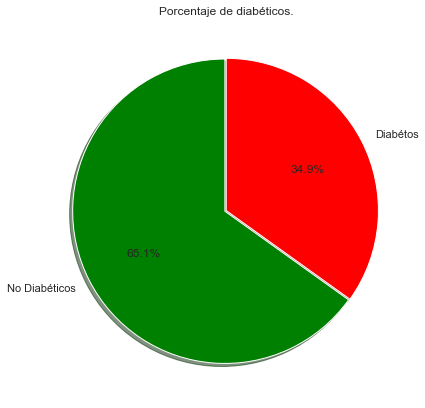

In [192]:
sns.set(style="whitegrid")
labels = ['No Diabéticos', 'Diabétos']
sizes = [healthy_people_num,sick_people_num]
colors = ["green","red"]
plt.figure(figsize=(7,7))
plt.pie(sizes, labels=labels, explode= (0.01,0) , colors=colors, autopct='%1.1f%%', shadow=True, startangle=90,)

plt.title('Porcentaje de diabéticos.')
plt.show()

In [193]:
df2 = df.copy()
df2[['Glucose','BloodPressure','SkinThickness','Insulin','BMI']] = df2[['Glucose','BloodPressure','SkinThickness','Insulin','BMI']].replace(0,np.NaN)

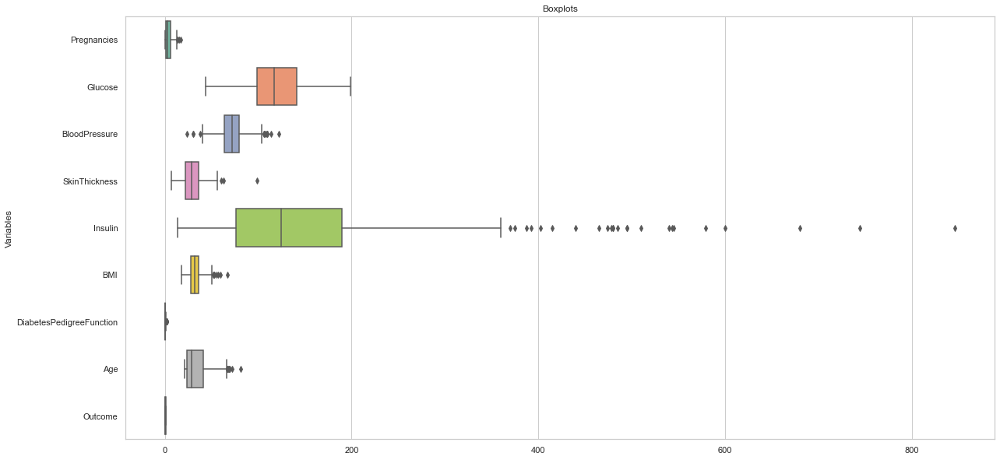

In [194]:
f, ax = plt.subplots(figsize=(20, 10))
plt.ylabel('Variables')
plt.title("Boxplots")
ax = sns.boxplot(data = df2, 
  orient = 'h', 
  palette = 'Set2')

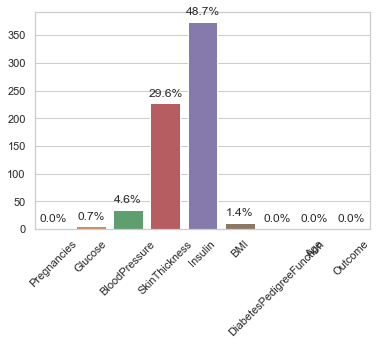

In [195]:
sns.set_theme(style="whitegrid")
ax = sns.barplot(x=df2.columns, y=df2.isnull().sum())
plt.xticks(rotation=45);
for p in ax.patches:
    ax.annotate(format(100*p.get_height()/df.shape[0], '.1f') + "%", 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 10), 
                   textcoords = 'offset points')

In [196]:
correlations = df2.corr()
correlations['Outcome'].sort_values(ascending=False)

Outcome                     1.000000
Glucose                     0.494650
BMI                         0.313680
Insulin                     0.303454
SkinThickness               0.259491
Age                         0.238356
Pregnancies                 0.221898
DiabetesPedigreeFunction    0.173844
BloodPressure               0.170589
Name: Outcome, dtype: float64

In [197]:
df = df.drop(['Insulin'], axis=1)
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,33.6,0.627,50,1
1,1,85,66,29,26.6,0.351,31,0
2,8,183,64,0,23.3,0.672,32,1
3,1,89,66,23,28.1,0.167,21,0
4,0,137,40,35,43.1,2.288,33,1


In [198]:
 def separate_data_and_labels(df):
        data = df.copy()
        y_values = data[data.columns[-1]].values.reshape(data.shape[0], 1)
        data = data.drop([data.columns[-1]], axis=1)
        return data, y_values

In [199]:
np.random.seed(0)
msk = np.random.rand(len(df)) < 0.8
train_val_df = df[msk]
testData = df[~msk]

train_val_data , y_train_val = separate_data_and_labels(train_val_df)
x_test_data, y_test_values = separate_data_and_labels(testData)

In [200]:
def specificity(y_true, y_pred):
    tn = K.sum(K.round(K.clip((1 - y_true) * (1 - y_pred), 0, 1)))
    fp = K.sum(K.round(K.clip((1 - y_true) * y_pred, 0, 1)))
    return tn / (tn + fp + K.epsilon())


def negative_predictive_value(y_true, y_pred):
    tn = K.sum(K.round(K.clip((1 - y_true) * (1 - y_pred), 0, 1)))
    fn = K.sum(K.round(K.clip(y_true * (1 - y_pred), 0, 1)))
    return tn / (tn + fn + K.epsilon())

def sensitivity(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    sens_keras = true_positives / (possible_positives + K.epsilon())
    return sens_keras

def positive_predictive_value(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    ppv_keras = true_positives / (predicted_positives + K.epsilon())
    return ppv_keras

In [201]:
def plot_loss(history):
    # Plot the training loss.
    plt.plot(history.history['loss'], 'r-')
    # Plot the validation loss.
    plt.plot(history.history['val_loss'], 'b-')
    # X-axis label.
    plt.xlabel('Epochs')
    # Y-axis label.
    plt.ylabel('Cost')
    # Graph legend.
    plt.legend(["Training loss", "Validation loss"])
    # Graph title.
    plt.title('Loss Graph')
    plt.show()

In [202]:
class DiabetesPredictor:
    def __init__(self, name):
        """DiabetesPredictor

    This is a class contains the most part of the methods needed for the diabetes predictor,
    first get the data of the csv file and then perform some methods to clean the data insid
    and allows you to choose if it has to replace outliers or not and replace nulls values or not.

    """
        self.name = name

    def fit(self, train_df, y_train, val_df, y_val, replaceOutliers, replaceNulls, nullColumns, outliersColumnsMap, columnsToRemove, polyFeatDeg, binsDiscretizer, earlyStop, dropOut, regu, batchNormalization, learning_rate, momentum, decay, multilayer):
        train_dataframe = train_df.copy()

        self.columnsToRemove = columnsToRemove.copy()
        self.nullCols = nullColumns.copy()
        self.replaceNulls = replaceNulls
        self.replaceOutliers = replaceOutliers
        self.polyFeatDeg = polyFeatDeg
        self.binsDiscretizer = binsDiscretizer
        self.earlyStop = earlyStop
        self.dropOut = dropOut
        self.regu = regu
        self.batchNormalization = batchNormalization
        self.learning_rate = learning_rate
        self.momentum = momentum
        self.decay = decay
        self.multilayer = multilayer

        self.replace_values_nulls = []
        self.replace_values_outliers = []
        self.outliersLimits = []
        self.history = None

        self.nullCols = [n for n in self.nullCols if n not in self.columnsToRemove]
        self.outlierCols = {}
        for k in outliersColumnsMap:
            if k not in self.columnsToRemove:
                self.outlierCols[k] = outliersColumnsMap[k].copy()

        train_dataframe = self.__preprocess_data__(train_dataframe, training=True)

        x_train_values = train_dataframe.values
        y_train_values = y_train.copy()

        self.input_shape = x_train_values.shape

        x_val_df = val_df.copy()
        x_val_df = self.__preprocess_data__(x_val_df)
        x_val_values = x_val_df.values
        y_val_values = y_val.copy()

        self.model = self.__train_model__(x_train_values, y_train_values, x_val_values,y_val_values)

        self.auc, self.spe, self.sen, self.ppv, self.npv, self.fpr, self.tpr = self.evaluate(x_val_df, y_val_values, testing = False)

        self.aucTrain, self.speTrain, self.senTrain, self.ppvTrain, self.npvTrain, self.fprTrain, self.tprTrain = self.evaluate(train_dataframe, y_train_values, testing = False)
        
    def __preprocess_data__(self, data, training = False):
        df = data.copy()
        df = self.__remove_columns__(df)

        if self.replaceNulls:
            df[self.nullCols] = df[self.nullCols].replace(0,np.NaN)

        if training:
            self.replace_values_outliers = self.__get_cols_median__(df)
            self.outliersLimits = self.__get_outliers_limits__(df)

        if(self.replaceOutliers):
            df = self.__replace_outliers__(df)

        if training:
            self.replace_values_nulls = self.__get_cols_median__(df)

        if(self.replaceNulls):
            df = self.__replace_nulls__(df)

        if (self.polyFeatDeg > 0):
            poly = PolynomialFeatures(degree=self.polyFeatDeg)
            polyArray = poly.fit_transform(df)
            c = poly.get_feature_names(df.columns)
            df = pd.DataFrame(polyArray, columns = c)

        if (self.binsDiscretizer > 1):
            disc = KBinsDiscretizer(n_bins=self.binsDiscretizer, encode='ordinal', strategy='uniform')
            df = disc.fit_transform(df)

        if training:
            self.mean_cols = self.__get_cols_mean__(df)
            self.std_cols = self.__get_cols_std__(df)

        df = self.__normalize_data__(df)

        return df

    def __get_cols_mean__(self, data):
        meandf = data.mean(axis = 0)
        meandf.columns = data.columns
        return meandf

    def __get_cols_std__(self, data):
        stddf= data.std(axis = 0)
        stddf.columns = data.columns
        return stddf

    def __get_cols_median__(self, data):
        mediandf = data.median(axis = 0)
        mediandf.columns = data.columns
        return mediandf

    def __get_outliers_limits__(self, data):
        df = pd.DataFrame(np.zeros((1,len(data.columns))), columns=data.columns)
        df = df.astype('object')
        for col in data.columns:
            col_min = 0
            col_max = np.Infinity
            if (col in self.outlierCols):
                #Cálculo de parámetros para obtener los outliers.
                q1 = data[col].quantile(0.25)
                q3 = data[col].quantile(0.75)
                iqr = q3-q1
                #Límites de los valores tipicos.
                lower_tail = q1 - 1.5 * iqr
                upper_tail = q3 + 1.5 * iqr

                col_min = min(lower_tail, self.outlierCols[col][0])
                col_max = max(upper_tail,self.outlierCols[col][1])
            lims = [col_min, col_max]
            df[col][0] = lims
        return df

    def __replace_outliers__(self, dataframe):
        #Para cada columna (excepto para el Outcome) se reemplazan los outliers por su mediana.
        df = dataframe.copy()
        for col in df.columns:
            out_min = self.outliersLimits[col][0][0]
            out_max = self.outliersLimits[col][0][1]
            for i in df[col]:
                if i > out_max or i < out_min:
                    df[col] = df[col].replace(i, self.replace_values_outliers[col])
        return df

    def __replace_nulls__(self, dataframe):
        df = dataframe.copy()
        for col in self.nullCols:
            df[col]=df[col].replace(np.NaN, self.replace_values_nulls[col])
        return df

    def __normalize_data__(self, dataframe):
        # Mean, columnar axis.
        df = dataframe.copy()
        for col in df.columns:
            if (self.std_cols[col] != 0):
                df[col] = (df[col] - self.mean_cols[col]) / self.std_cols[col]
            else:
                df[col] = 0
        return df

    def __remove_columns__(self, dataframe):
        df = dataframe.copy()
        df = df.drop(self.columnsToRemove, axis=1)
        return df

    def __model_builder__(self):
        model = Sequential()
        initializer = tf.keras.initializers.GlorotNormal(seed=7)
        if (self.multilayer):
            model.add(Dense(12, kernel_initializer='unifo', bias_initializer=initializer, input_shape=(self.input_shape[1],), activation='relu'))
            model.add(Dense(8, kernel_initializer=initializer, bias_initializer=initializer, activation='relu'))
            model.add(Dense(1, kernel_initializer=initializer, bias_initializer=initializer,activation='sigmoid'))
        else:
            if(self.dropOut):
                model.add(Dropout(0.5,input_shape=(self.input_shape[1],)))
            elif(self.batchNormalization):
                model.add(BatchNormalization(input_shape=(self.input_shape[1],)))
            
            if(self.regu == 'l1' or self.regu == 'l2'):
                reg = reg_wrapper(self.regu, 0.1)
                model.add(Dense(1, kernel_initializer=initializer,bias_initializer=initializer,kernel_regularizer=reg, activation='sigmoid'))
            else:
                model.add(Dense(1, kernel_initializer=initializer, bias_initializer=initializer,activation='sigmoid'))

        learning_rate = 1e-3
        momentum = 0.99
        decay = 1e-4

        model.compile(optimizer=optimizers.SGD(learning_rate=learning_rate, momentum=momentum, decay = decay),
                        loss=keras.losses.BinaryCrossentropy(),
                        metrics=[tf.keras.metrics.AUC()])
        return model

    def __train_model__(self, x_train, y_train, x_val, y_val):        
        stop_early = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5)

        model = self.__model_builder__()

        ckpt_model = 'saved_models/'+ self.name
        checkpoint = ModelCheckpoint(ckpt_model, 
                            monitor='val_loss',
                            verbose=0,
                            save_best_only=True,
                            mode='min')

        cbks = [checkpoint]
        if (self.earlyStop):
            cbks.append(stop_early)
        
        history = model.fit(x_train, y_train, epochs=125, validation_data = (x_val, y_val), verbose=0, callbacks = cbks)

        self.history = history
        # Plot Loss
        plot_loss(history)        

        # Return trained model
        return model

    def evaluate(self, x_val_df, y_val, testing=True):
        x_df = x_val_df.copy()
        predictions, rounded_preds = self.predict(x_df, testing=testing)

        fpr_keras, tpr_keras, thresholds_keras = roc_curve(y_val, predictions)
        auc_keras = auc(fpr_keras, tpr_keras)
        spe = specificity(y_val.astype(float),  rounded_preds.astype(float))
        sen = sensitivity(y_val.astype(float),  rounded_preds.astype(float))
        ppv = positive_predictive_value(y_val.astype(float), rounded_preds.astype(float))
        npv = negative_predictive_value(y_val.astype(float), rounded_preds.astype(float))

        if (testing):
            self.plot_roc(fpr_keras, tpr_keras, auc_keras)
            print('AUC ' + str(auc_keras))
            print('Specificity: ' + str(spe))
            print('Sensitivity: ' + str(sen))
            print('Positive Predictive Value: ' + str(ppv))
            print('Negative Predictive Value: ' + str(npv))

        return auc_keras, spe, sen, ppv, npv, fpr_keras, tpr_keras

    def predict(self, x_val_df, testing=True):
        x_df = x_val_df.copy()
        if (testing):
            x_df = self.__preprocess_data__(x_df)
        predictions = self.model(x_df.values)
        rounded_preds = np.rint(predictions)
        return predictions, rounded_preds

    def plot_roc_validation(self):
        self.plot_roc(self.fpr, self.tpr, self.auc)

    def plot_roc(self, fpr, tpr, auc):
        plt.figure(1)
        plt.plot([0, 1], [0, 1], 'k--')
        plt.plot(fpr, tpr, label=' (Area = {:.3f})'.format(auc))
        plt.xlabel('False positive rate')
        plt.ylabel('True positive rate')
        plt.title('ROC curve ' + self.name)
        plt.legend(loc='best')
        plt.show()

In [203]:
def reg_wrapper(type, value):
    if type == 'l2':
        return regularizers.l2(value)
    if type == 'l1':
        return regularizers.l1(value)

In [204]:
kf = KFold(n_splits = 5)

def cross_val(name, replaceOutliers=False, replaceNulls=False, nullColumns=[], outliersColumnsMap={}, columnsToRemove=[], polyFeatDeg = -1, binsDiscretizer = -1, earlyStop = False, dropOut = False, regu = '', batchNormalization = False, learning_rate = 1e-5, momentum= 0.99, decay = 1e-4, multilayer = False):
    folds = kf.split(train_val_data)
    bestModel = None
    aucs = []
    spes = []
    sens = []
    ppvs = []
    npvs = []
    aucsTrain = []
    i = 0
    for train_index, val_index in folds:
        print('Fold ' + str(i))
        newModel = DiabetesPredictor(name + str(i))
        i += 1
        X_train, X_val = train_val_data.iloc[train_index], train_val_data.iloc[val_index]
        Y_train, Y_val = y_train_val[train_index], y_train_val[val_index]
        newModel.fit(X_train, Y_train, X_val, Y_val, replaceOutliers=replaceOutliers, replaceNulls=replaceNulls, nullColumns = nullColumns, outliersColumnsMap=outliersColumnsMap, columnsToRemove=columnsToRemove, polyFeatDeg=polyFeatDeg, binsDiscretizer=binsDiscretizer, earlyStop=earlyStop, dropOut=dropOut, regu=regu, batchNormalization=batchNormalization, learning_rate = learning_rate, momentum= momentum, decay = decay, multilayer = multilayer)
        aucs.append(newModel.auc)
        spes.append(newModel.spe)
        sens.append(newModel.sen)
        ppvs.append(newModel.ppv)
        npvs.append(newModel.npv)
        aucsTrain.append(newModel.aucTrain)
        if (bestModel==None or newModel.auc > bestModel.auc):
            bestModel = newModel
    
    aucTrainMean = np.mean(np.array(aucsTrain))
    aucMean = np.mean(np.array(aucs))
    speMean = np.mean(np.array(spes))
    senMean = np.mean(np.array(sens))
    ppvMean = np.mean(np.array(ppvs))
    npvMean = np.mean(np.array(npvs))

    print('AUC Val: ' + str(aucMean))
    print('AUC Train: ' + str(aucTrainMean))
    print('Specificity: ' + str(speMean))
    print('Sensitivity: ' + str(senMean))
    print('Positive Predictive Value: ' + str(ppvMean))
    print('Negative Predictive Value: ' + str(npvMean))

    
    return bestModel, aucMean, speMean, senMean, ppvMean, npvMean, aucTrainMean


### Sin limpiar datos

Fold 0
INFO:tensorflow:Assets written to: saved_models\predictor0\assets
INFO:tensorflow:Assets written to: saved_models\predictor0\assets
INFO:tensorflow:Assets written to: saved_models\predictor0\assets
INFO:tensorflow:Assets written to: saved_models\predictor0\assets
INFO:tensorflow:Assets written to: saved_models\predictor0\assets
INFO:tensorflow:Assets written to: saved_models\predictor0\assets
INFO:tensorflow:Assets written to: saved_models\predictor0\assets
INFO:tensorflow:Assets written to: saved_models\predictor0\assets
INFO:tensorflow:Assets written to: saved_models\predictor0\assets
INFO:tensorflow:Assets written to: saved_models\predictor0\assets
INFO:tensorflow:Assets written to: saved_models\predictor0\assets
INFO:tensorflow:Assets written to: saved_models\predictor0\assets
INFO:tensorflow:Assets written to: saved_models\predictor0\assets
INFO:tensorflow:Assets written to: saved_models\predictor0\assets
INFO:tensorflow:Assets written to: saved_models\predictor0\assets
INF

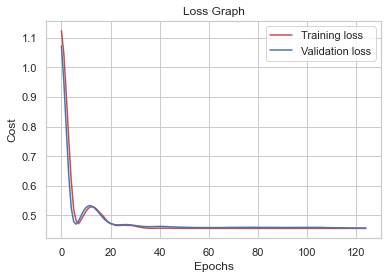

Fold 1
INFO:tensorflow:Assets written to: saved_models\predictor1\assets
INFO:tensorflow:Assets written to: saved_models\predictor1\assets
INFO:tensorflow:Assets written to: saved_models\predictor1\assets
INFO:tensorflow:Assets written to: saved_models\predictor1\assets
INFO:tensorflow:Assets written to: saved_models\predictor1\assets
INFO:tensorflow:Assets written to: saved_models\predictor1\assets
INFO:tensorflow:Assets written to: saved_models\predictor1\assets
INFO:tensorflow:Assets written to: saved_models\predictor1\assets


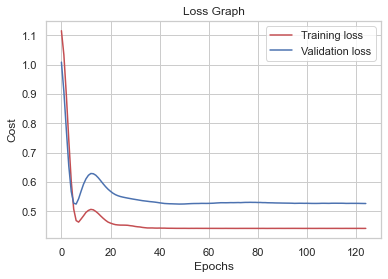

Fold 2
INFO:tensorflow:Assets written to: saved_models\predictor2\assets
INFO:tensorflow:Assets written to: saved_models\predictor2\assets
INFO:tensorflow:Assets written to: saved_models\predictor2\assets
INFO:tensorflow:Assets written to: saved_models\predictor2\assets
INFO:tensorflow:Assets written to: saved_models\predictor2\assets
INFO:tensorflow:Assets written to: saved_models\predictor2\assets
INFO:tensorflow:Assets written to: saved_models\predictor2\assets
INFO:tensorflow:Assets written to: saved_models\predictor2\assets
INFO:tensorflow:Assets written to: saved_models\predictor2\assets
INFO:tensorflow:Assets written to: saved_models\predictor2\assets
INFO:tensorflow:Assets written to: saved_models\predictor2\assets
INFO:tensorflow:Assets written to: saved_models\predictor2\assets
INFO:tensorflow:Assets written to: saved_models\predictor2\assets
INFO:tensorflow:Assets written to: saved_models\predictor2\assets
INFO:tensorflow:Assets written to: saved_models\predictor2\assets
INF

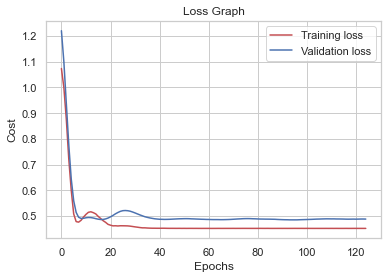

Fold 3
INFO:tensorflow:Assets written to: saved_models\predictor3\assets
INFO:tensorflow:Assets written to: saved_models\predictor3\assets
INFO:tensorflow:Assets written to: saved_models\predictor3\assets
INFO:tensorflow:Assets written to: saved_models\predictor3\assets
INFO:tensorflow:Assets written to: saved_models\predictor3\assets
INFO:tensorflow:Assets written to: saved_models\predictor3\assets
INFO:tensorflow:Assets written to: saved_models\predictor3\assets
INFO:tensorflow:Assets written to: saved_models\predictor3\assets
INFO:tensorflow:Assets written to: saved_models\predictor3\assets
INFO:tensorflow:Assets written to: saved_models\predictor3\assets
INFO:tensorflow:Assets written to: saved_models\predictor3\assets
INFO:tensorflow:Assets written to: saved_models\predictor3\assets
INFO:tensorflow:Assets written to: saved_models\predictor3\assets
INFO:tensorflow:Assets written to: saved_models\predictor3\assets
INFO:tensorflow:Assets written to: saved_models\predictor3\assets
INF

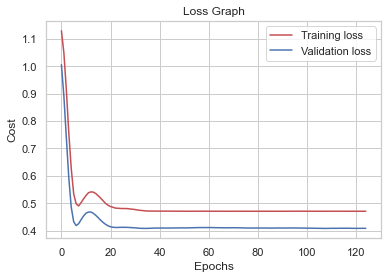

Fold 4
INFO:tensorflow:Assets written to: saved_models\predictor4\assets
INFO:tensorflow:Assets written to: saved_models\predictor4\assets
INFO:tensorflow:Assets written to: saved_models\predictor4\assets
INFO:tensorflow:Assets written to: saved_models\predictor4\assets
INFO:tensorflow:Assets written to: saved_models\predictor4\assets
INFO:tensorflow:Assets written to: saved_models\predictor4\assets
INFO:tensorflow:Assets written to: saved_models\predictor4\assets
INFO:tensorflow:Assets written to: saved_models\predictor4\assets
INFO:tensorflow:Assets written to: saved_models\predictor4\assets
INFO:tensorflow:Assets written to: saved_models\predictor4\assets
INFO:tensorflow:Assets written to: saved_models\predictor4\assets
INFO:tensorflow:Assets written to: saved_models\predictor4\assets
INFO:tensorflow:Assets written to: saved_models\predictor4\assets
INFO:tensorflow:Assets written to: saved_models\predictor4\assets
INFO:tensorflow:Assets written to: saved_models\predictor4\assets
INF

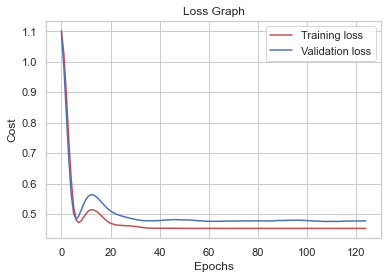

AUC Val: 0.8425646449293567
AUC Train: 0.8509284675993538
Specificity: 0.8745921361333615
Sensitivity: 0.5938407381592213
Positive Predictive Value: 0.7150793630514812
Negative Predictive Value: 0.7960311914102782


In [205]:
simplePred, aucPred, spePred, senPred, ppvPred, npvPred, aucTrainPred = cross_val('predictor')

## Limpiando Datos
#### Reemplazando Nulls por la mediana

Fold 0
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor0\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor0\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor0\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor0\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor0\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor0\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor0\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor0\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor0\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor0\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor0\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor0\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor0\assets
INFO:

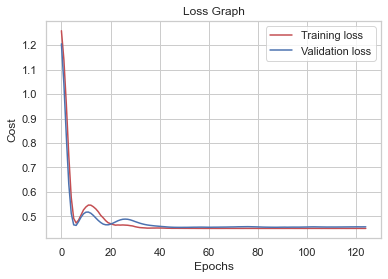

Fold 1
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor1\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor1\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor1\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor1\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor1\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor1\assets


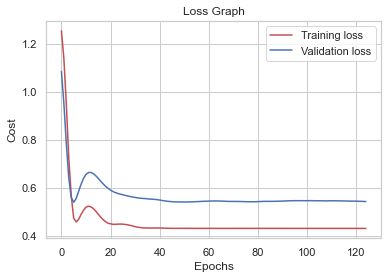

Fold 2
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor2\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor2\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor2\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor2\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor2\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor2\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor2\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor2\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor2\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor2\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor2\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor2\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor2\assets
INFO:

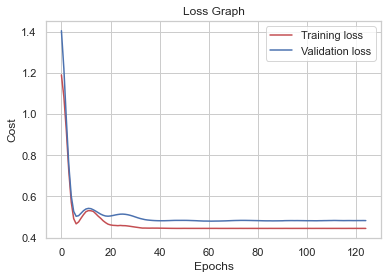

Fold 3
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor3\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor3\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor3\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor3\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor3\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor3\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor3\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor3\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor3\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor3\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor3\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor3\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor3\assets
INFO:

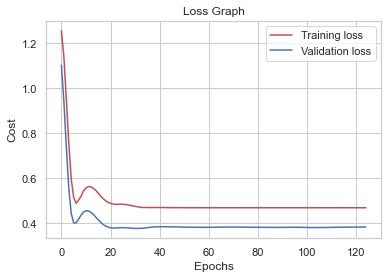

Fold 4
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor4\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor4\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor4\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor4\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor4\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor4\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor4\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor4\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor4\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor4\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor4\assets
INFO:tensorflow:Assets written to: saved_models\rep_nulls_predictor4\assets


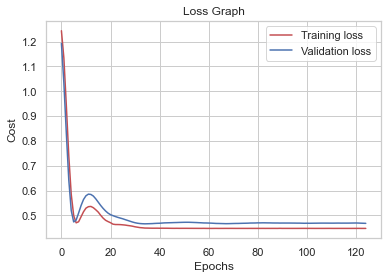

AUC Val: 0.8483277428892043
AUC Train: 0.8560021510909903
Specificity: 0.883213504660605
Sensitivity: 0.5913707824343739
Positive Predictive Value: 0.7273579147451658
Negative Predictive Value: 0.7963835653097437


In [206]:
repNullPred, aucrepNull, sperepNull, senrepNull, ppvrepNull, npvrepNull, aucTrainRepNull = cross_val('rep_nulls_predictor',replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'])

#### Reemplazando Outliers

Fold 0
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor0\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor0\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor0\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor0\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor0\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor0\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor0\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor0\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor0\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor0\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor0\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor0\assets
INFO:tensorflow:Assets written to: saved_mode

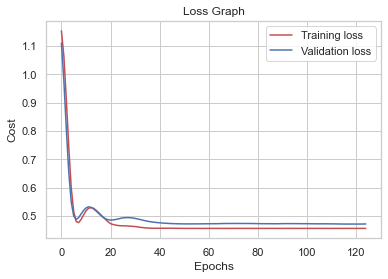

Fold 1
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor1\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor1\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor1\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor1\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor1\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor1\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor1\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor1\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor1\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor1\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor1\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor1\assets
INFO:tensorflow:Assets written to: saved_mode

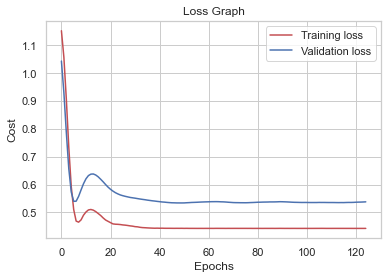

Fold 2
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor2\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor2\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor2\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor2\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor2\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor2\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor2\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor2\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor2\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor2\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor2\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor2\assets
INFO:tensorflow:Assets written to: saved_mode

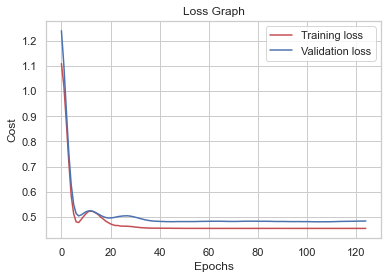

Fold 3
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor3\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor3\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor3\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor3\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor3\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor3\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor3\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor3\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor3\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor3\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor3\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor3\assets
INFO:tensorflow:Assets written to: saved_mode

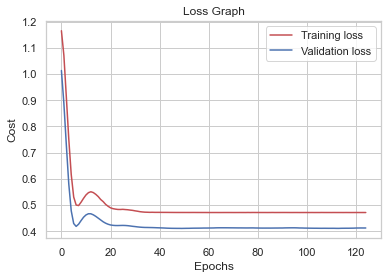

Fold 4
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor4\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor4\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor4\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor4\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor4\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor4\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor4\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor4\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor4\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor4\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor4\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_predictor4\assets
INFO:tensorflow:Assets written to: saved_mode

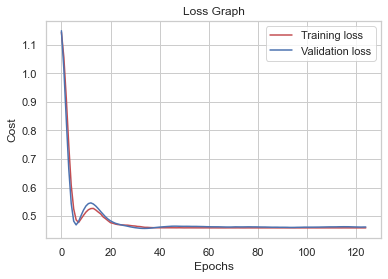

AUC Val: 0.8409777764638229
AUC Train: 0.8495183624774839
Specificity: 0.883213504660605
Sensitivity: 0.5752755822099033
Positive Predictive Value: 0.7208590081504607
Negative Predictive Value: 0.7911305658847801


(<__main__.DiabetesPredictor at 0x17ded32fb20>,
 0.8409777764638229,
 0.883213504660605,
 0.5752755822099033,
 0.7208590081504607,
 0.7911305658847801,
 0.8495183624774839)

In [207]:
cross_val('rep_outliers_predictor', replaceOutliers=True, outliersColumnsMap={'BMI': [18.5, 50],'BloodPressure':[40,120],'SkinThickness': [0, np.Infinity], 'Pregnancies': [0, np.Infinity]})

#### Reemplazando Outliers y nulls

Fold 0
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor0\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor0\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor0\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor0\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor0\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor0\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor0\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor0\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor0\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor0\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor0\assets
INFO:tensorflow:Assets written to: saved_models\rep_outlie

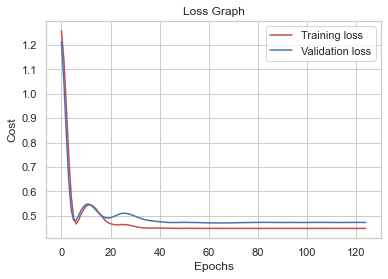

Fold 1
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor1\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor1\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor1\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor1\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor1\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor1\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor1\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor1\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor1\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor1\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor1\assets
INFO:tensorflow:Assets written to: saved_models\rep_outlie

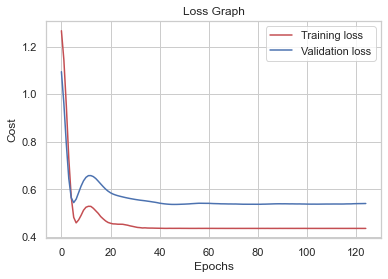

Fold 2
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor2\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor2\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor2\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor2\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor2\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor2\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor2\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor2\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor2\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor2\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor2\assets
INFO:tensorflow:Assets written to: saved_models\rep_outlie

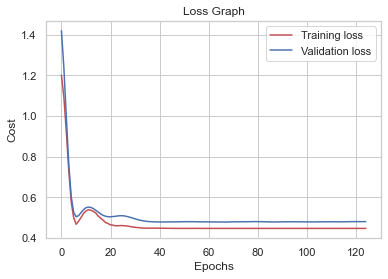

Fold 3
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor3\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor3\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor3\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor3\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor3\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor3\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor3\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor3\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor3\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor3\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor3\assets
INFO:tensorflow:Assets written to: saved_models\rep_outlie

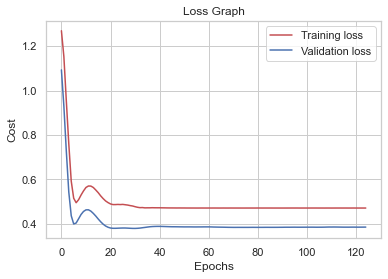

Fold 4
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor4\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor4\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor4\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor4\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor4\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor4\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor4\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor4\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor4\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor4\assets
INFO:tensorflow:Assets written to: saved_models\rep_outliers_nulls_predictor4\assets


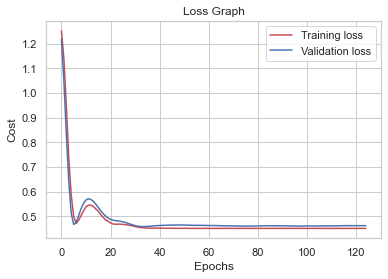

AUC Val: 0.8466939815300714
AUC Train: 0.8539346979798916
Specificity: 0.8859912824345247
Sensitivity: 0.5835276451948506
Positive Predictive Value: 0.7287289894532007
Negative Predictive Value: 0.7936921621306346


(<__main__.DiabetesPredictor at 0x17e16ea8d00>,
 0.8466939815300714,
 0.8859912824345247,
 0.5835276451948506,
 0.7287289894532007,
 0.7936921621306346,
 0.8539346979798916)

In [208]:
cross_val('rep_outliers_nulls_predictor',replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], replaceOutliers=True, outliersColumnsMap={'BMI': [18.5, 50],'BloodPressure':[40,120],'SkinThickness': [0, np.Infinity], 'Pregnancies': [0, np.Infinity]})

Comparando los resultados anteriores:
- AUC reemplazando nulls: 0.849
- AUC reemplazando outliers y nulls: 0.847
- AUC reemplazando outliers: 0.840

Dado que el valor más alto es reemplazando nulls, continuamos el análisis con este parámetro.

#### Removiendo Columnas

BloodPressure
Fold 0
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure0\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure0\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure0\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure0\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure0\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure0\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure0\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure0\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure0\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure0\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure0\assets
INFO:tensor

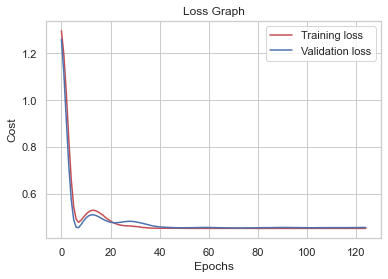

Fold 1
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure1\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure1\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure1\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure1\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure1\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure1\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure1\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure1\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure1\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure1\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure1\assets
INFO:tensorflow:Assets wr

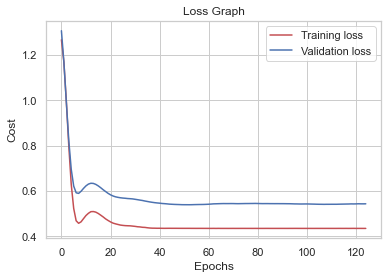

Fold 2
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure2\assets
INFO:tensorflow:Assets wr

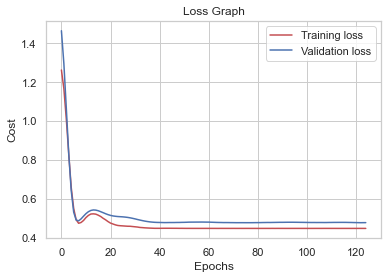

Fold 3
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure3\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure3\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure3\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure3\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure3\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure3\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure3\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure3\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure3\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure3\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure3\assets
INFO:tensorflow:Assets wr

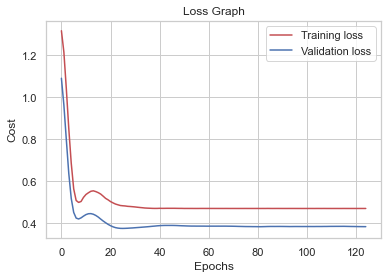

Fold 4
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure4\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure4\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure4\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure4\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure4\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure4\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_BloodPressure4\assets


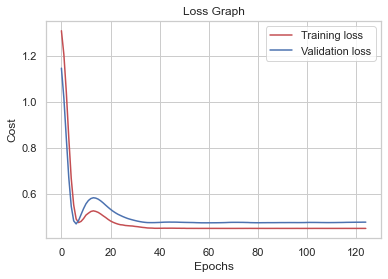

AUC Val: 0.8473362826082316
AUC Train: 0.8557628945474542
Specificity: 0.8862310084612938
Sensitivity: 0.571346438164817
Positive Predictive Value: 0.7247287163101632
Negative Predictive Value: 0.7899245225701037
Age
Fold 0
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Age0\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Age0\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Age0\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Age0\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Age0\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Age0\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Age0\assets


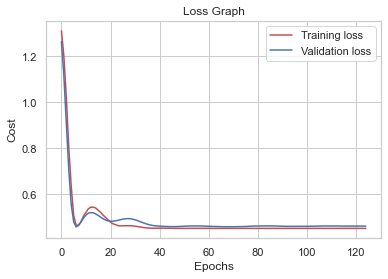

Fold 1
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Age1\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Age1\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Age1\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Age1\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Age1\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Age1\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Age1\assets


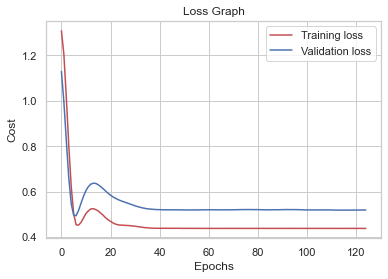

Fold 2
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Age2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Age2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Age2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Age2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Age2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Age2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Age2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Age2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Age2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Age2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Age2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Age2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_p

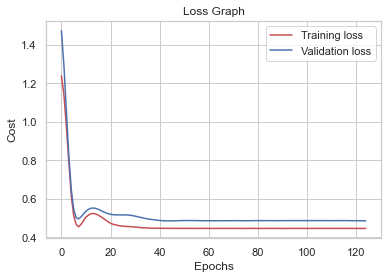

Fold 3
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Age3\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Age3\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Age3\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Age3\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Age3\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Age3\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Age3\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Age3\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Age3\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Age3\assets


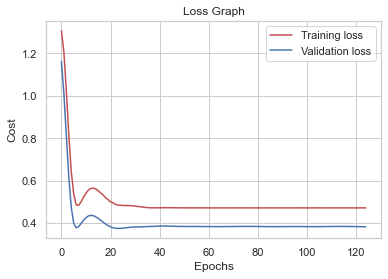

Fold 4
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Age4\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Age4\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Age4\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Age4\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Age4\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Age4\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Age4\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Age4\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Age4\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Age4\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Age4\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Age4\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_p

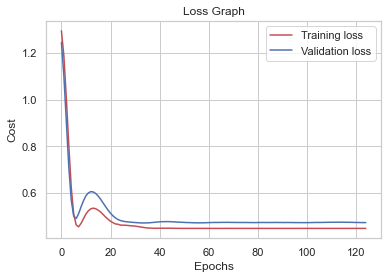

AUC Val: 0.8500744387340962
AUC Train: 0.8546990062954288
Specificity: 0.8804737786369607
Sensitivity: 0.5785276452073507
Positive Predictive Value: 0.7192427069347862
Negative Predictive Value: 0.7906029620427871
DiabetesPedigreeFunction
Fold 0
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_DiabetesPedigreeFunction0\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_DiabetesPedigreeFunction0\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_DiabetesPedigreeFunction0\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_DiabetesPedigreeFunction0\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_DiabetesPedigreeFunction0\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_DiabetesPedigreeFunction0\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_DiabetesPedigreeFunction0\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predi

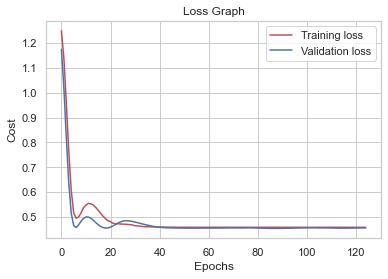

Fold 1
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_DiabetesPedigreeFunction1\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_DiabetesPedigreeFunction1\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_DiabetesPedigreeFunction1\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_DiabetesPedigreeFunction1\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_DiabetesPedigreeFunction1\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_DiabetesPedigreeFunction1\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_DiabetesPedigreeFunction1\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_DiabetesPedigreeFunction1\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_DiabetesPedigreeFunction1\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_DiabetesPedigreeFunction1\assets
INF

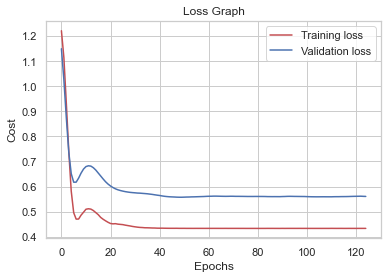

Fold 2
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_DiabetesPedigreeFunction2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_DiabetesPedigreeFunction2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_DiabetesPedigreeFunction2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_DiabetesPedigreeFunction2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_DiabetesPedigreeFunction2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_DiabetesPedigreeFunction2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_DiabetesPedigreeFunction2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_DiabetesPedigreeFunction2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_DiabetesPedigreeFunction2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_DiabetesPedigreeFunction2\assets
INF

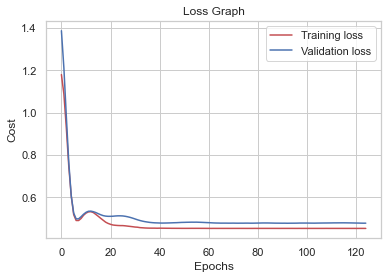

Fold 3
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_DiabetesPedigreeFunction3\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_DiabetesPedigreeFunction3\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_DiabetesPedigreeFunction3\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_DiabetesPedigreeFunction3\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_DiabetesPedigreeFunction3\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_DiabetesPedigreeFunction3\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_DiabetesPedigreeFunction3\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_DiabetesPedigreeFunction3\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_DiabetesPedigreeFunction3\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_DiabetesPedigreeFunction3\assets
INF

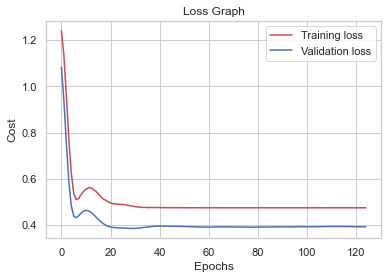

Fold 4
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_DiabetesPedigreeFunction4\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_DiabetesPedigreeFunction4\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_DiabetesPedigreeFunction4\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_DiabetesPedigreeFunction4\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_DiabetesPedigreeFunction4\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_DiabetesPedigreeFunction4\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_DiabetesPedigreeFunction4\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_DiabetesPedigreeFunction4\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_DiabetesPedigreeFunction4\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_DiabetesPedigreeFunction4\assets
INF

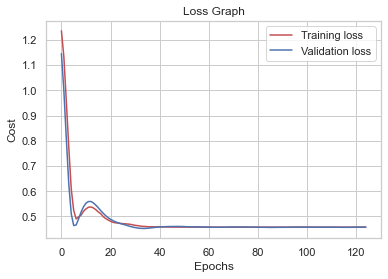

AUC Val: 0.8462866205416246
AUC Train: 0.850238361319765
Specificity: 0.8732499256341253
Sensitivity: 0.5952923510541355
Positive Predictive Value: 0.7140604554982807
Negative Predictive Value: 0.7960789233984438
Pregnancies
Fold 0
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies0\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies0\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies0\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies0\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies0\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies0\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies0\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies0\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies0\a

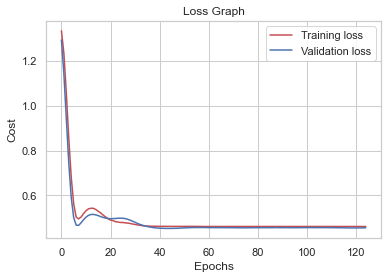

Fold 1
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies1\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies1\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies1\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies1\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies1\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies1\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies1\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies1\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies1\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies1\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies1\assets
INFO:tensorflow:Assets written to: saved_models

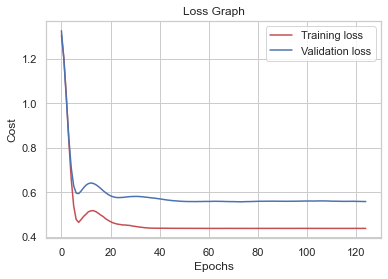

Fold 2
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies2\assets
INFO:tensorflow:Assets written to: saved_models

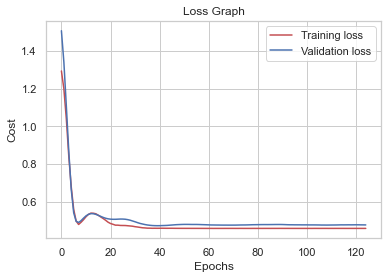

Fold 3
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies3\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies3\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies3\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies3\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies3\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies3\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies3\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies3\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies3\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies3\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies3\assets
INFO:tensorflow:Assets written to: saved_models

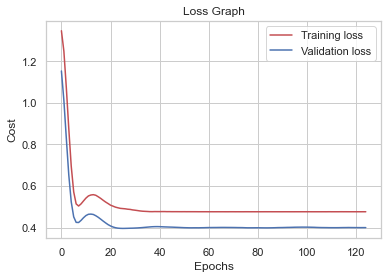

Fold 4
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies4\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies4\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies4\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies4\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies4\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies4\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies4\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies4\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies4\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies4\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_Pregnancies4\assets
INFO:tensorflow:Assets written to: saved_models

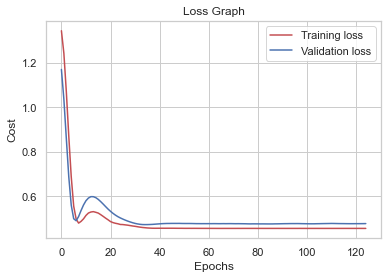

AUC Val: 0.8405503930284519
AUC Train: 0.8487406267670213
Specificity: 0.885147691674951
Sensitivity: 0.6085162452336592
Positive Predictive Value: 0.7369167497123092
Negative Predictive Value: 0.8035301947763636
SkinThickness
Fold 0
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_SkinThickness0\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_SkinThickness0\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_SkinThickness0\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_SkinThickness0\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_SkinThickness0\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_SkinThickness0\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_SkinThickness0\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_SkinThickness0\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predic

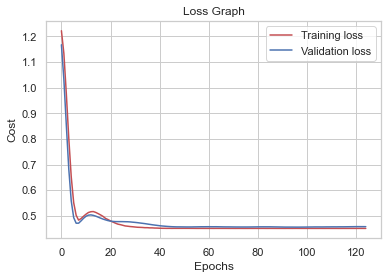

Fold 1
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_SkinThickness1\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_SkinThickness1\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_SkinThickness1\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_SkinThickness1\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_SkinThickness1\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_SkinThickness1\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_SkinThickness1\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_SkinThickness1\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_SkinThickness1\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_SkinThickness1\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_SkinThickness1\assets
INFO:tensorflow:Assets wr

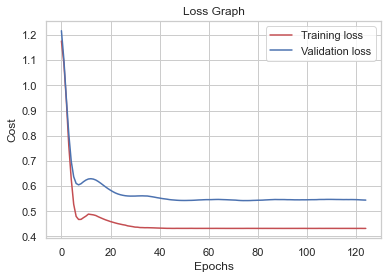

Fold 2
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_SkinThickness2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_SkinThickness2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_SkinThickness2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_SkinThickness2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_SkinThickness2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_SkinThickness2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_SkinThickness2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_SkinThickness2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_SkinThickness2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_SkinThickness2\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_SkinThickness2\assets
INFO:tensorflow:Assets wr

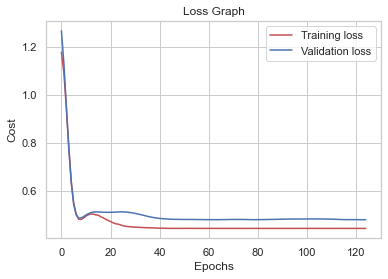

Fold 3
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_SkinThickness3\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_SkinThickness3\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_SkinThickness3\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_SkinThickness3\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_SkinThickness3\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_SkinThickness3\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_SkinThickness3\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_SkinThickness3\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_SkinThickness3\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_SkinThickness3\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_SkinThickness3\assets
INFO:tensorflow:Assets wr

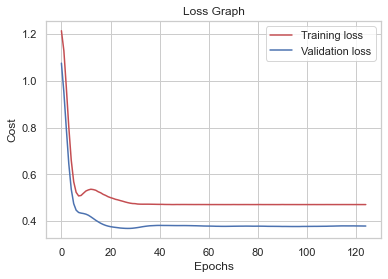

Fold 4
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_SkinThickness4\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_SkinThickness4\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_SkinThickness4\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_SkinThickness4\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_SkinThickness4\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_SkinThickness4\assets
INFO:tensorflow:Assets written to: saved_models\rem_col_predictor_SkinThickness4\assets


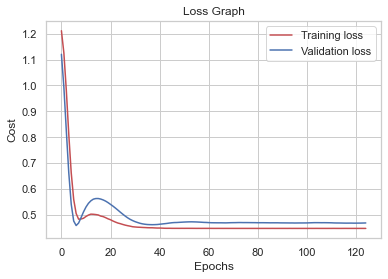

AUC Val: 0.8501304338876057
AUC Train: 0.85601593428368
Specificity: 0.8807135046637299
Sensitivity: 0.5895703323318406
Positive Predictive Value: 0.7228235705153268
Negative Predictive Value: 0.7958227509960929


In [209]:
bestAuc = aucrepNull
tryRemovingCols = ['BloodPressure', 'Age', 'DiabetesPedigreeFunction', 'Pregnancies', 'SkinThickness']
removeCols = []
removeColsAuc = []
nullCols = ['Glucose','BloodPressure','SkinThickness','BMI']	
		
for col in tryRemovingCols:
	print(col)	
	remColPred, aucremCol, speremCol, senremCol, ppvremCol, npvremCol, aucTrainRemCol = cross_val('rem_col_predictor_' + col ,replaceNulls=True, nullColumns=nullCols, columnsToRemove=[col])
	if (aucremCol > bestAuc):
		removeCols.append(col)
		removeColsAuc.append(aucremCol)

In [210]:
print(removeCols)
print(removeColsAuc)

['Age', 'SkinThickness']
[0.8500744387340962, 0.8501304338876057]


#### Eliminando todas las columnas que superaron el valor anterior.

Fold 0
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor0\assets
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor0\assets
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor0\assets
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor0\assets
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor0\assets
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor0\assets
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor0\assets
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor0\assets
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor0\assets
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor0\assets


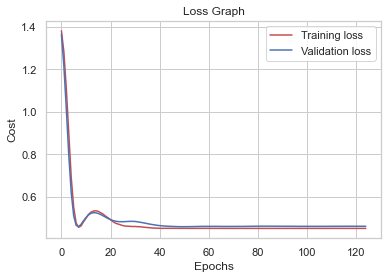

Fold 1
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor1\assets
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor1\assets
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor1\assets
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor1\assets
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor1\assets
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor1\assets
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor1\assets
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor1\assets
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor1\assets
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor1\assets
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor1\assets
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor1\assets
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor1\assets
INFO:tensorflow:As

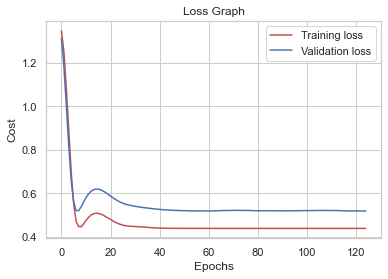

Fold 2
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor2\assets
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor2\assets
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor2\assets
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor2\assets
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor2\assets
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor2\assets
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor2\assets
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor2\assets


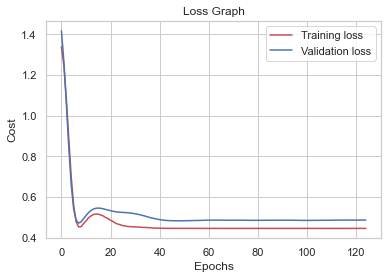

Fold 3
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor3\assets
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor3\assets
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor3\assets
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor3\assets
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor3\assets
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor3\assets
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor3\assets
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor3\assets
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor3\assets
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor3\assets
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor3\assets
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor3\assets
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor3\assets
INFO:tensorflow:As

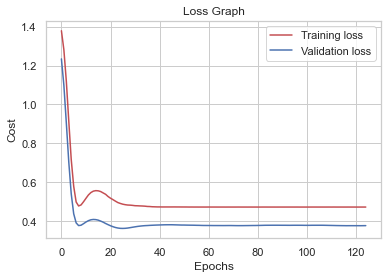

Fold 4
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor4\assets
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor4\assets
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor4\assets
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor4\assets
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor4\assets
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor4\assets
INFO:tensorflow:Assets written to: saved_models\rem_cols_predictor4\assets


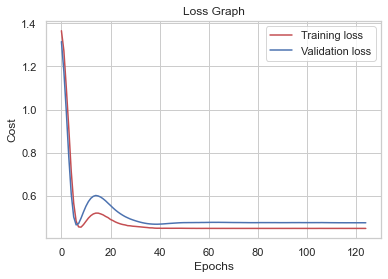

AUC Val: 0.8494020407721428
AUC Train: 0.8547282272064699
Specificity: 0.8824079656513069
Sensitivity: 0.5713464381648171
Positive Predictive Value: 0.7218181796646924
Negative Predictive Value: 0.7886639874618939


(<__main__.DiabetesPredictor at 0x17e230cc0d0>,
 0.8494020407721428,
 0.8824079656513069,
 0.5713464381648171,
 0.7218181796646924,
 0.7886639874618939,
 0.8547282272064699)

In [211]:
cross_val('rem_cols_predictor' ,replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=removeCols)

AUC:
- Eliminando Age: 0.85
- Eliminando 'Age', 'SkinThickness': 0.849
- Eliminando SkinThickness: 0.849

Procedemos eliminando la columna de Age

1
Fold 0
INFO:tensorflow:Assets written to: saved_models\featPol1_0\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_0\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_0\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_0\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_0\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_0\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_0\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_0\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_0\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_0\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_0\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_0\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_0\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_0\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_0\assets
I

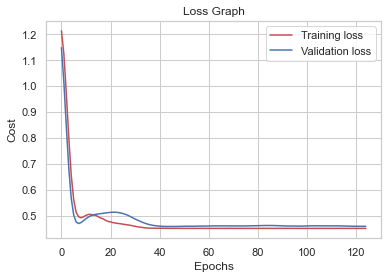

Fold 1
INFO:tensorflow:Assets written to: saved_models\featPol1_1\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_1\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_1\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_1\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_1\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_1\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_1\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_1\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_1\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_1\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_1\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_1\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_1\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_1\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_1\assets
INF

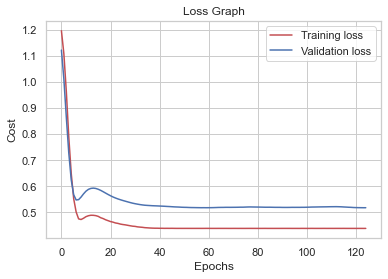

Fold 2
INFO:tensorflow:Assets written to: saved_models\featPol1_2\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_2\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_2\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_2\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_2\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_2\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_2\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_2\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_2\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_2\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_2\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_2\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_2\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_2\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_2\assets
INF

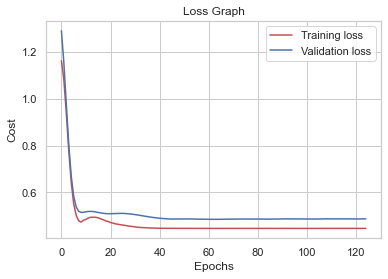

Fold 3
INFO:tensorflow:Assets written to: saved_models\featPol1_3\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_3\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_3\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_3\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_3\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_3\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_3\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_3\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_3\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_3\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_3\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_3\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_3\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_3\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_3\assets
INF

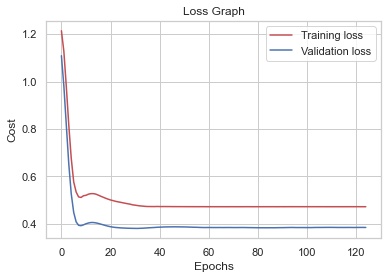

Fold 4
INFO:tensorflow:Assets written to: saved_models\featPol1_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol1_4\assets
INF

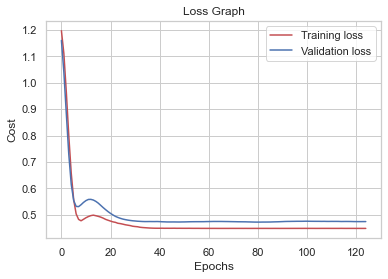

AUC Val: 0.8501097100596506
AUC Train: 0.8547068525119783
Specificity: 0.8780928262588429
Sensitivity: 0.5738764824274696
Positive Predictive Value: 0.7134622129364184
Negative Predictive Value: 0.7884002833257697
2
Fold 0
INFO:tensorflow:Assets written to: saved_models\featPol2_0\assets
INFO:tensorflow:Assets written to: saved_models\featPol2_0\assets
INFO:tensorflow:Assets written to: saved_models\featPol2_0\assets
INFO:tensorflow:Assets written to: saved_models\featPol2_0\assets
INFO:tensorflow:Assets written to: saved_models\featPol2_0\assets
INFO:tensorflow:Assets written to: saved_models\featPol2_0\assets
INFO:tensorflow:Assets written to: saved_models\featPol2_0\assets
INFO:tensorflow:Assets written to: saved_models\featPol2_0\assets
INFO:tensorflow:Assets written to: saved_models\featPol2_0\assets


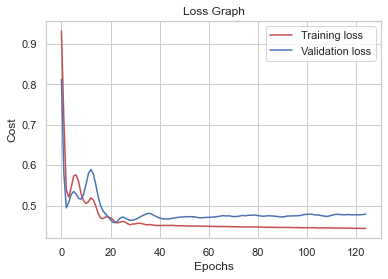

Fold 1
INFO:tensorflow:Assets written to: saved_models\featPol2_1\assets
INFO:tensorflow:Assets written to: saved_models\featPol2_1\assets
INFO:tensorflow:Assets written to: saved_models\featPol2_1\assets


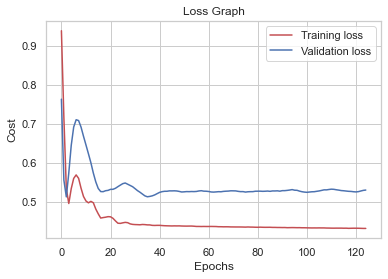

Fold 2
INFO:tensorflow:Assets written to: saved_models\featPol2_2\assets
INFO:tensorflow:Assets written to: saved_models\featPol2_2\assets
INFO:tensorflow:Assets written to: saved_models\featPol2_2\assets
INFO:tensorflow:Assets written to: saved_models\featPol2_2\assets
INFO:tensorflow:Assets written to: saved_models\featPol2_2\assets
INFO:tensorflow:Assets written to: saved_models\featPol2_2\assets
INFO:tensorflow:Assets written to: saved_models\featPol2_2\assets
INFO:tensorflow:Assets written to: saved_models\featPol2_2\assets
INFO:tensorflow:Assets written to: saved_models\featPol2_2\assets
INFO:tensorflow:Assets written to: saved_models\featPol2_2\assets
INFO:tensorflow:Assets written to: saved_models\featPol2_2\assets
INFO:tensorflow:Assets written to: saved_models\featPol2_2\assets
INFO:tensorflow:Assets written to: saved_models\featPol2_2\assets


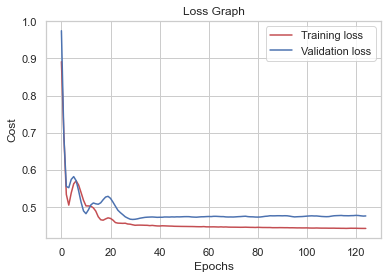

Fold 3
INFO:tensorflow:Assets written to: saved_models\featPol2_3\assets
INFO:tensorflow:Assets written to: saved_models\featPol2_3\assets
INFO:tensorflow:Assets written to: saved_models\featPol2_3\assets
INFO:tensorflow:Assets written to: saved_models\featPol2_3\assets
INFO:tensorflow:Assets written to: saved_models\featPol2_3\assets
INFO:tensorflow:Assets written to: saved_models\featPol2_3\assets


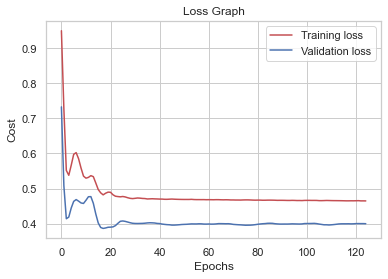

Fold 4
INFO:tensorflow:Assets written to: saved_models\featPol2_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol2_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol2_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol2_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol2_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol2_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol2_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol2_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol2_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol2_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol2_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol2_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol2_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol2_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol2_4\assets
INF

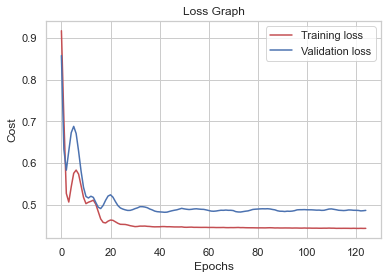

AUC Val: 0.8456454129998188
AUC Train: 0.8609060161444099
Specificity: 0.8767714142349858
Sensitivity: 0.5838407381842213
Positive Predictive Value: 0.7176369510727535
Negative Predictive Value: 0.7924820730890505
3
Fold 0
INFO:tensorflow:Assets written to: saved_models\featPol3_0\assets
INFO:tensorflow:Assets written to: saved_models\featPol3_0\assets
INFO:tensorflow:Assets written to: saved_models\featPol3_0\assets
INFO:tensorflow:Assets written to: saved_models\featPol3_0\assets
INFO:tensorflow:Assets written to: saved_models\featPol3_0\assets


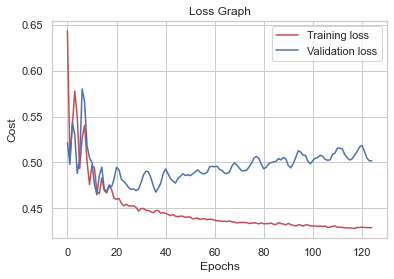

Fold 1
INFO:tensorflow:Assets written to: saved_models\featPol3_1\assets
INFO:tensorflow:Assets written to: saved_models\featPol3_1\assets


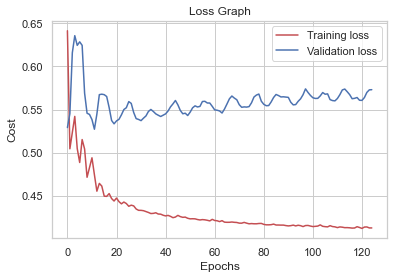

Fold 2
INFO:tensorflow:Assets written to: saved_models\featPol3_2\assets
INFO:tensorflow:Assets written to: saved_models\featPol3_2\assets
INFO:tensorflow:Assets written to: saved_models\featPol3_2\assets
INFO:tensorflow:Assets written to: saved_models\featPol3_2\assets
INFO:tensorflow:Assets written to: saved_models\featPol3_2\assets
INFO:tensorflow:Assets written to: saved_models\featPol3_2\assets
INFO:tensorflow:Assets written to: saved_models\featPol3_2\assets


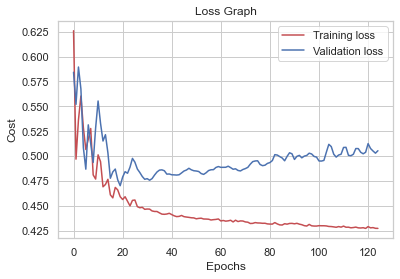

Fold 3
INFO:tensorflow:Assets written to: saved_models\featPol3_3\assets
INFO:tensorflow:Assets written to: saved_models\featPol3_3\assets
INFO:tensorflow:Assets written to: saved_models\featPol3_3\assets
INFO:tensorflow:Assets written to: saved_models\featPol3_3\assets
INFO:tensorflow:Assets written to: saved_models\featPol3_3\assets
INFO:tensorflow:Assets written to: saved_models\featPol3_3\assets
INFO:tensorflow:Assets written to: saved_models\featPol3_3\assets


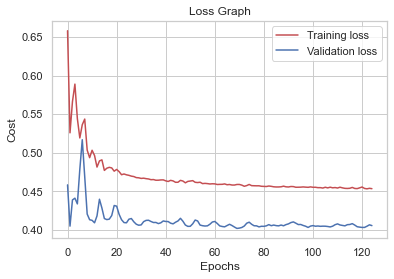

Fold 4
INFO:tensorflow:Assets written to: saved_models\featPol3_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol3_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol3_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol3_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol3_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol3_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol3_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol3_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol3_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol3_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol3_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol3_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol3_4\assets


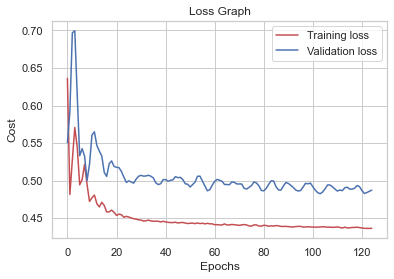

AUC Val: 0.8338517098656352
AUC Train: 0.8664148970136811
Specificity: 0.8622648580069676
Sensitivity: 0.5899115941141351
Positive Predictive Value: 0.6943578700602402
Negative Predictive Value: 0.7919342244075863
4
Fold 0
INFO:tensorflow:Assets written to: saved_models\featPol4_0\assets
INFO:tensorflow:Assets written to: saved_models\featPol4_0\assets
INFO:tensorflow:Assets written to: saved_models\featPol4_0\assets


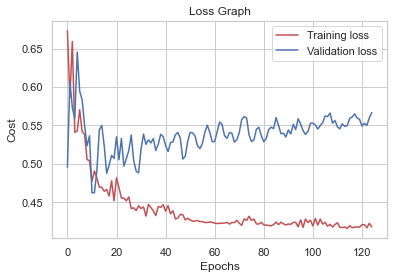

Fold 1
INFO:tensorflow:Assets written to: saved_models\featPol4_1\assets


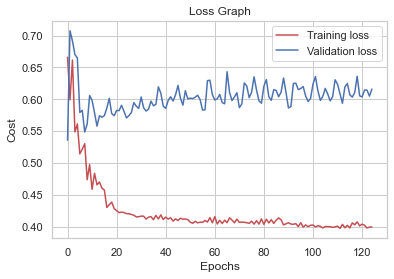

Fold 2
INFO:tensorflow:Assets written to: saved_models\featPol4_2\assets
INFO:tensorflow:Assets written to: saved_models\featPol4_2\assets
INFO:tensorflow:Assets written to: saved_models\featPol4_2\assets
INFO:tensorflow:Assets written to: saved_models\featPol4_2\assets
INFO:tensorflow:Assets written to: saved_models\featPol4_2\assets
INFO:tensorflow:Assets written to: saved_models\featPol4_2\assets


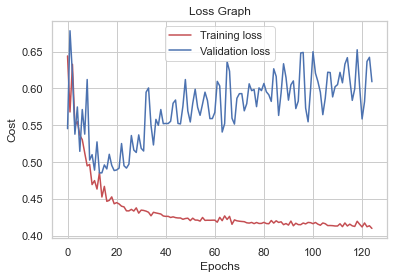

Fold 3
INFO:tensorflow:Assets written to: saved_models\featPol4_3\assets


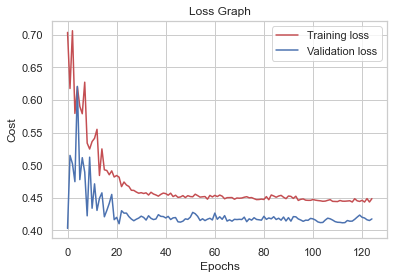

Fold 4
INFO:tensorflow:Assets written to: saved_models\featPol4_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol4_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol4_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol4_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol4_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol4_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol4_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol4_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol4_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol4_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol4_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol4_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol4_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol4_4\assets
INFO:tensorflow:Assets written to: saved_models\featPol4_4\assets
INF

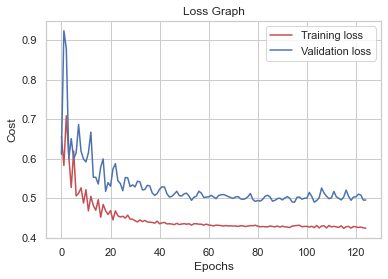

AUC Val: 0.8134226130532654
AUC Train: 0.8738923321092121
Specificity: 0.8464233707481427
Sensitivity: 0.6010067943511056
Positive Predictive Value: 0.6796010842123894
Negative Predictive Value: 0.7923530485007061


In [212]:
aucPolys = []
for i in range(1,5):
    print(i)
    polyPred, aucPoly, spePoly, senPoly, ppvPoly, npvPoly, aucTrainPoly = cross_val('featPol' + str(i) + '_' ,replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=['Age'], polyFeatDeg=i)
    aucPolys.append(aucPoly)

bestPolDeg = aucPolys.index(max(aucPolys)) + 1

In [213]:
print(aucPolys)

[0.8501097100596506, 0.8456454129998188, 0.8338517098656352, 0.8134226130532654]


In [214]:
print('Best Degree: ' + str(bestPolDeg) + " --- AUC: " + str(max(aucPolys)))

Best Degree: 1 --- AUC: 0.8501097100596506


#### Vuelvo a probar con EarlyStopping (había overfitting)

1
Fold 0
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_0\assets


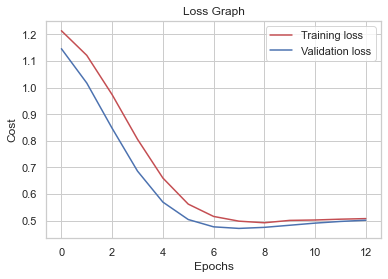

Fold 1
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_1\assets


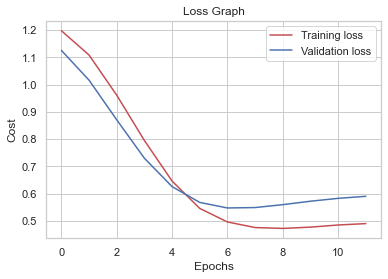

Fold 2
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_2\assets


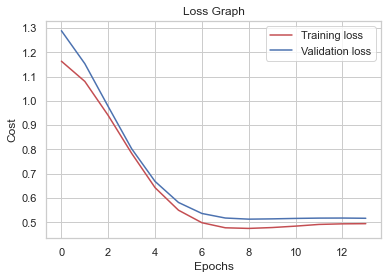

Fold 3
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_3\assets


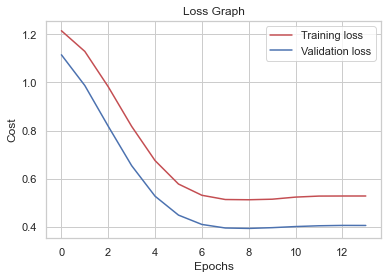

Fold 4
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_4\assets


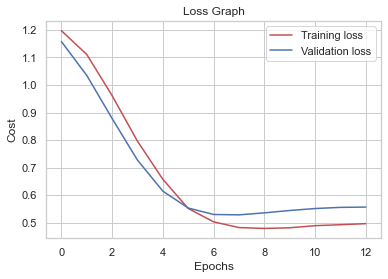

AUC Val: 0.8460348556543623
AUC Train: 0.8486900069833251
Specificity: 0.8301724135645776
Sensitivity: 0.6703296396070576
Positive Predictive Value: 0.6792788919363596
Negative Predictive Value: 0.8185417323087482
2
Fold 0
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_0\assets


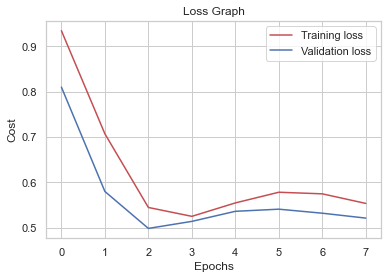

Fold 1
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_1\assets


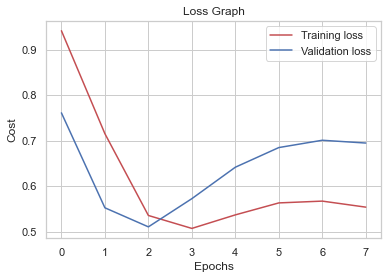

Fold 2
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_2\assets


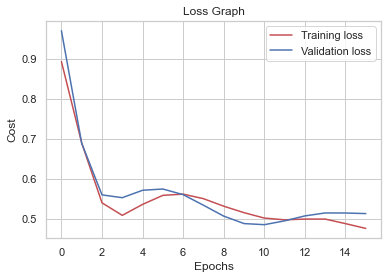

Fold 3
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_3\assets


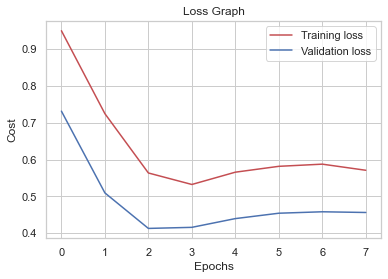

Fold 4
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_4\assets


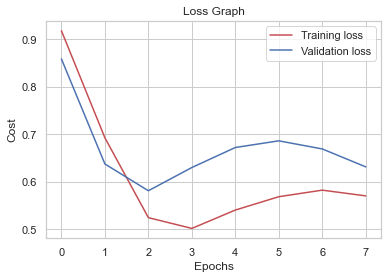

AUC Val: 0.8387240715503564
AUC Train: 0.8466769696102622
Specificity: 0.8245685488380232
Sensitivity: 0.6378109953180966
Positive Predictive Value: 0.6616653536204715
Negative Predictive Value: 0.803544230466373
3
Fold 0
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_0\assets


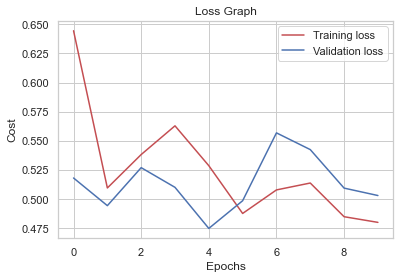

Fold 1
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_1\assets


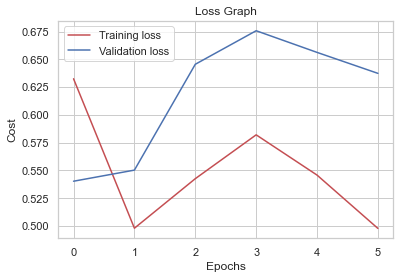

Fold 2
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_2\assets


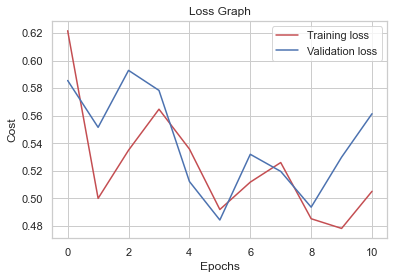

Fold 3
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_3\assets


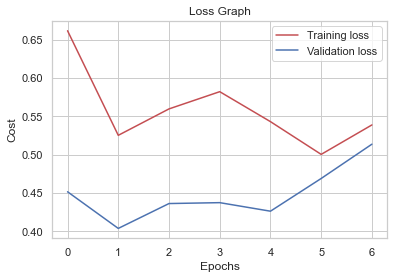

Fold 4
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_4\assets


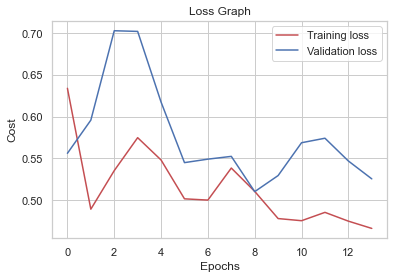

AUC Val: 0.799427526354033
AUC Train: 0.826106674300541
Specificity: 0.8833017799975161
Sensitivity: 0.5629666226789352
Positive Predictive Value: 0.7266185965321074
Negative Predictive Value: 0.7899396797777334
4
Fold 0
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_0\assets


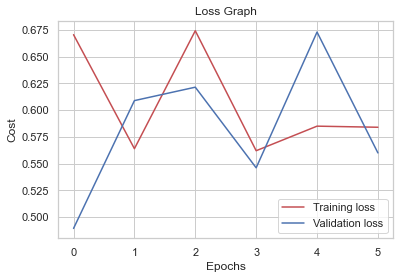

Fold 1
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_1\assets


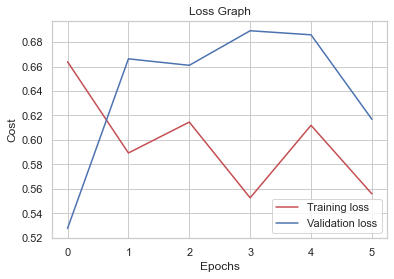

Fold 2
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_2\assets


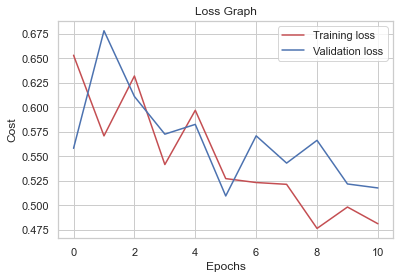

Fold 3
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_3\assets


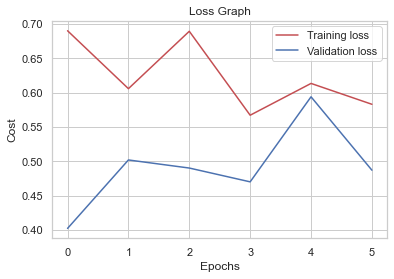

Fold 4
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_4\assets


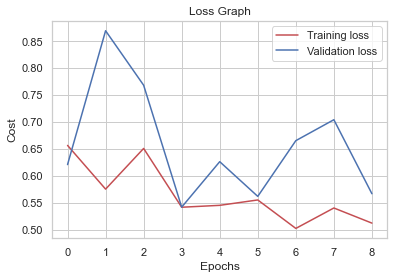

AUC Val: 0.8309915687225526
AUC Train: 0.8457365938566429
Specificity: 0.8666094225106882
Sensitivity: 0.5723458056707343
Positive Predictive Value: 0.6999429635453944
Negative Predictive Value: 0.7885529240998206


In [215]:
aucEarlyPolys = []
for i in range(1,5):
    print(i)
    polyPred, aucPoly, spePoly, senPoly, ppvPoly, npvPoly, aucTrainPoly = cross_val('featPolEarly' + str(i) + '_' ,replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=['Age'], polyFeatDeg=i, earlyStop=True)
    aucEarlyPolys.append(aucPoly)

bestPolDeg = aucEarlyPolys.index(max(aucEarlyPolys)) + 1

In [216]:
print('Best Degree: ' + str(bestPolDeg) + " --- AUC: " + str(max(aucPolys)))

Best Degree: 1 --- AUC: 0.8501097100596506


#### Con reg L1

1
Fold 0
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_0\asse

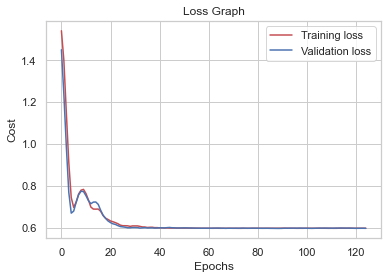

Fold 1
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_1\assets

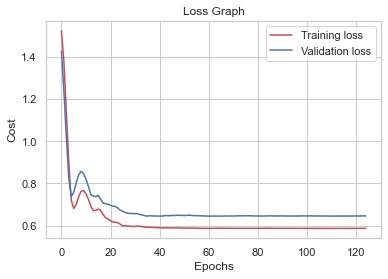

Fold 2
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_2\assets

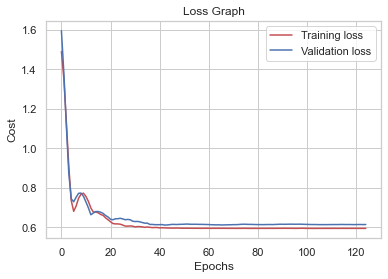

Fold 3
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_3\assets

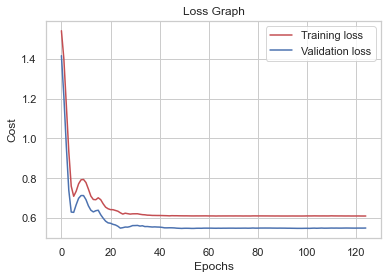

Fold 4
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly1_4\assets

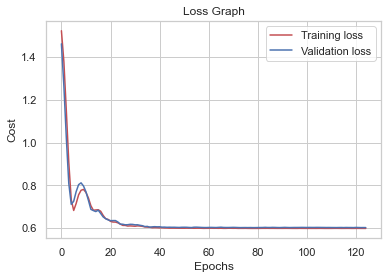

AUC Val: 0.8152363664095713
AUC Train: 0.818585486781662
Specificity: 0.9407665170576596
Sensitivity: 0.39445464212470743
Positive Predictive Value: 0.7859523771931067
Negative Predictive Value: 0.7413844152233998
2
Fold 0
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_0\ass

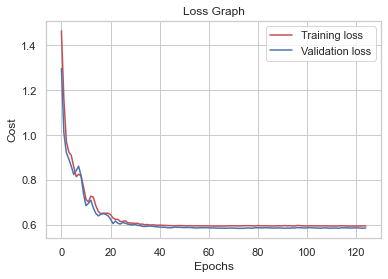

Fold 1
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_1\assets

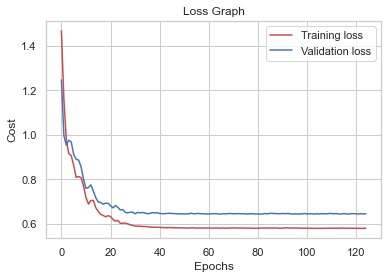

Fold 2
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_2\assets

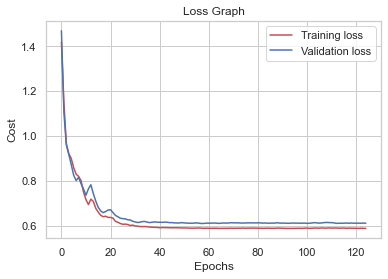

Fold 3
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_3\assets

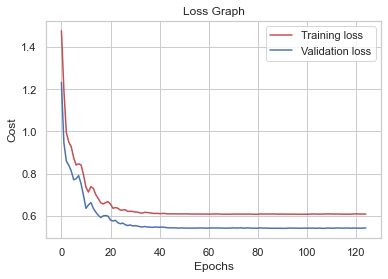

Fold 4
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly2_4\assets

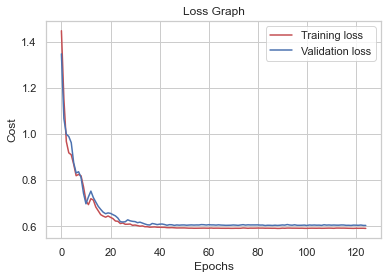

AUC Val: 0.8343994573670361
AUC Train: 0.8382822139669395
Specificity: 0.9348886088253143
Sensitivity: 0.4130197980740255
Positive Predictive Value: 0.7753730372856197
Negative Predictive Value: 0.7456701378824737
3
Fold 0
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_0\ass

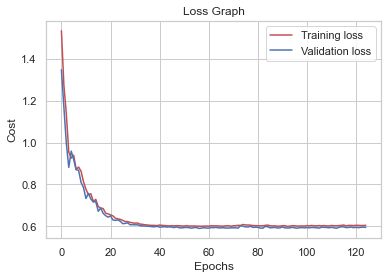

Fold 1
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_1\assets

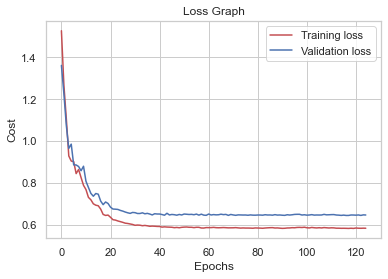

Fold 2
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_2\assets

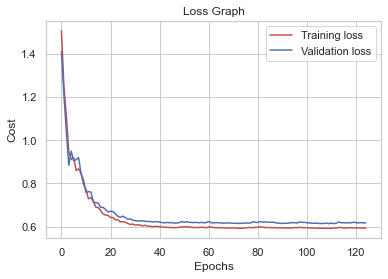

Fold 3
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_3\assets

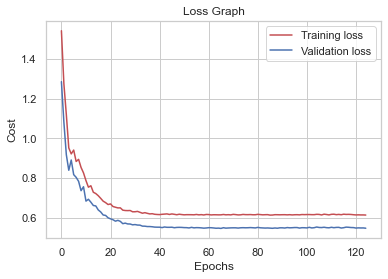

Fold 4
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly3_4\assets

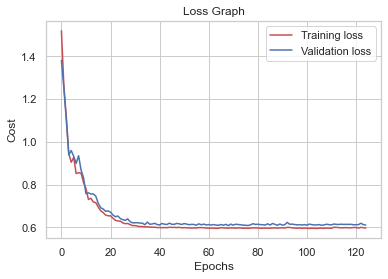

AUC Val: 0.8399749514728979
AUC Train: 0.8460251105610626
Specificity: 0.9354544218078431
Sensitivity: 0.4133686352816445
Positive Predictive Value: 0.7731459539367509
Negative Predictive Value: 0.7460316861996469
4
Fold 0
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_0\ass

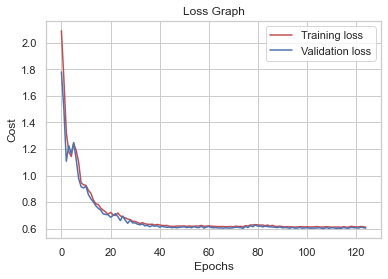

Fold 1
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_1\assets

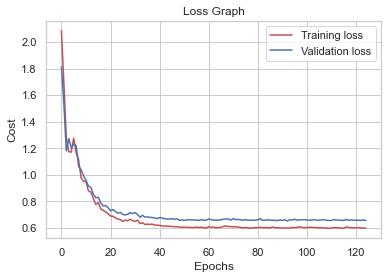

Fold 2
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_2\assets

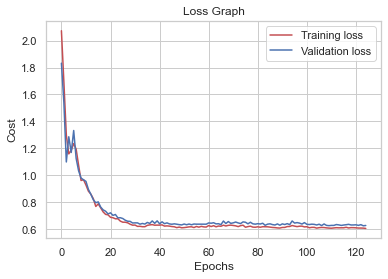

Fold 3
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_3\assets

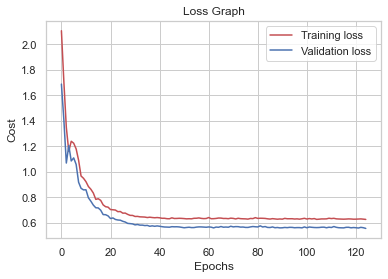

Fold 4
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly4_4\assets

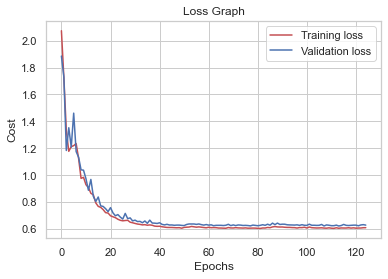

AUC Val: 0.8416070812198294
AUC Train: 0.8484226240444801
Specificity: 0.9355751002158552
Sensitivity: 0.42979207934613506
Positive Predictive Value: 0.7805346666646744
Negative Predictive Value: 0.7518965155838295
5
Fold 0
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_0\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_0\as

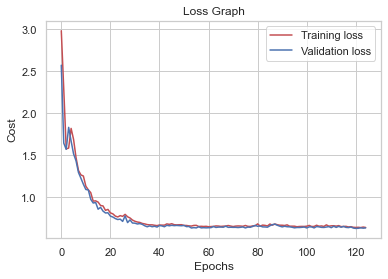

Fold 1
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_1\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_1\assets

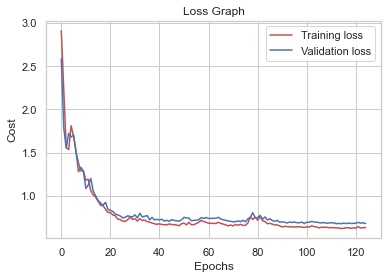

Fold 2
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_2\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_2\assets

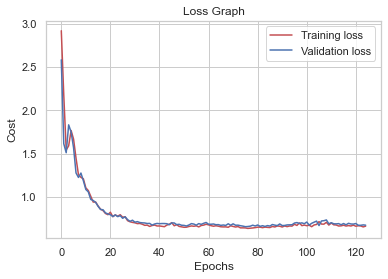

Fold 3
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_3\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_3\assets

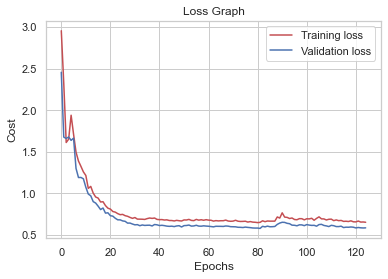

Fold 4
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_4\assets
INFO:tensorflow:Assets written to: saved_models\featPolEarly5_4\assets

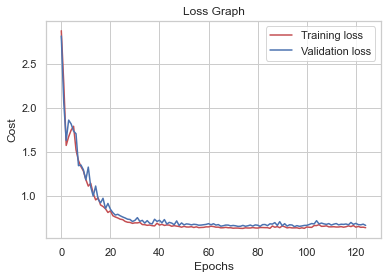

AUC Val: 0.845918638250416
AUC Train: 0.8508165167877285
Specificity: 0.9237893859440227
Sensitivity: 0.43985216785894005
Positive Predictive Value: 0.7507424719130198
Negative Predictive Value: 0.7516734686241698


In [217]:
aucReguPolys = []
for i in range(1,6):
    print(i)
    polyPred, aucPoly, spePoly, senPoly, ppvPoly, npvPoly, aucTrainPoly = cross_val('featPolEarly' + str(i) + '_' ,replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=['Age'], polyFeatDeg=i, regu='l1')
    aucReguPolys.append(aucPoly)

bestPolReguL1Deg = aucReguPolys.index(max(aucReguPolys)) + 1

In [218]:
print('Best Degree: ' + str(bestPolReguL1Deg) + " --- AUC: " + str(max(aucPolys)))

Best Degree: 5 --- AUC: 0.8501097100596506


#### Con reg L2

1
Fold 0


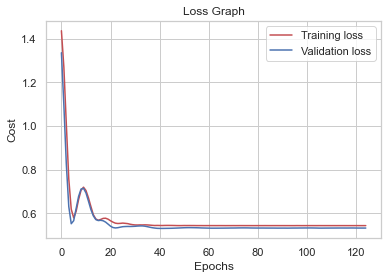

Fold 1


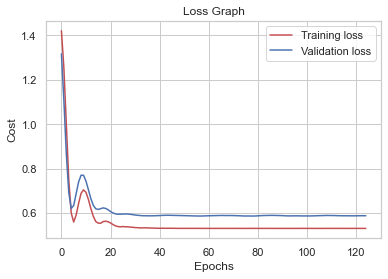

Fold 2


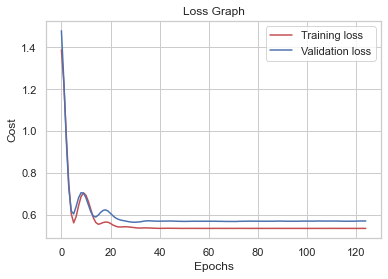

Fold 3


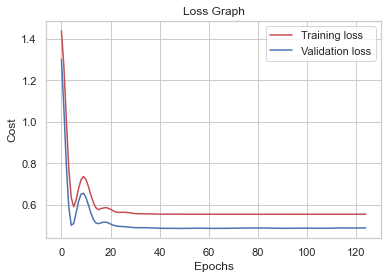

Fold 4


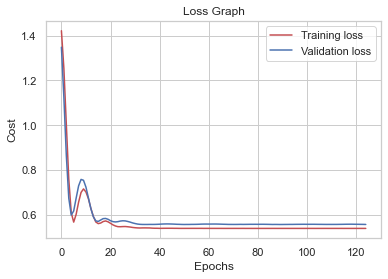

AUC Val: 0.8480234810493501
AUC Train: 0.8511379611365477
Specificity: 0.9230337869026947
Sensitivity: 0.456268036498106
Positive Predictive Value: 0.755709504951638
Negative Predictive Value: 0.7572352135492532
2
Fold 0


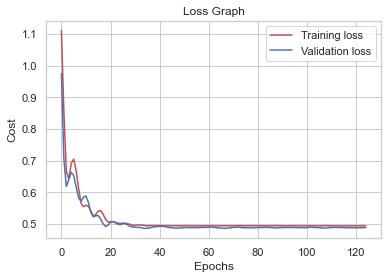

Fold 1


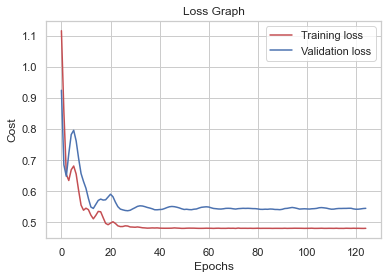

Fold 2


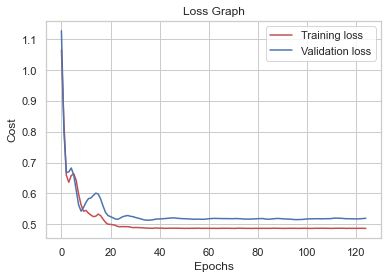

Fold 3


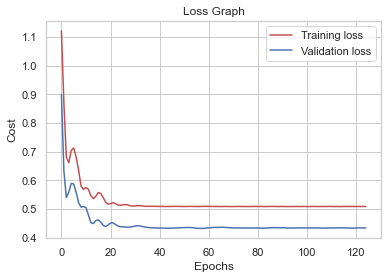

Fold 4


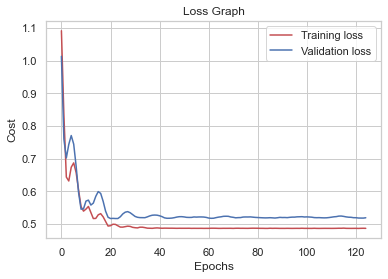

AUC Val: 0.8502695606719207
AUC Train: 0.8541494091687329
Specificity: 0.9007875046572821
Sensitivity: 0.5434789566557371
Positive Predictive Value: 0.7424177092148299
Negative Predictive Value: 0.7822387930818404
3
Fold 0


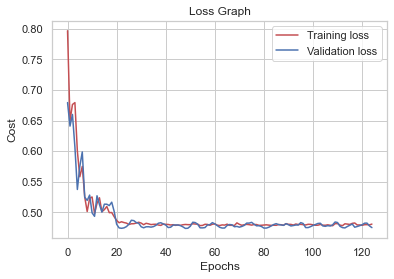

Fold 1


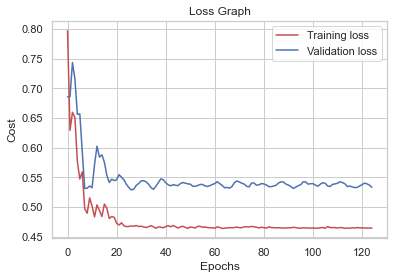

Fold 2


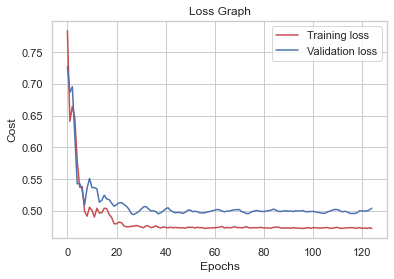

Fold 3


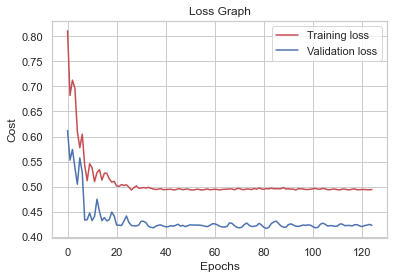

Fold 4


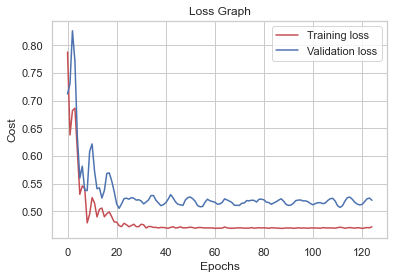

AUC Val: 0.8511039630581813
AUC Train: 0.8563962338475172
Specificity: 0.8906651954725151
Sensitivity: 0.5549305695256511
Positive Predictive Value: 0.7280844133328396
Negative Predictive Value: 0.7838511848027331
4
Fold 0


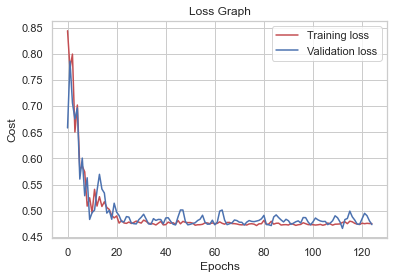

Fold 1


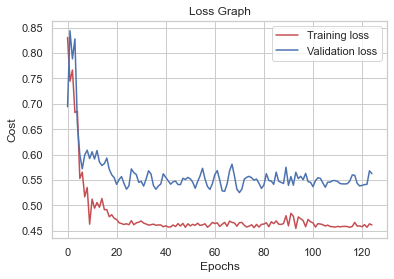

Fold 2


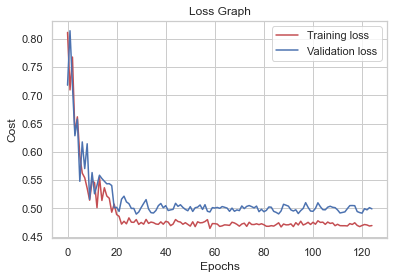

Fold 3


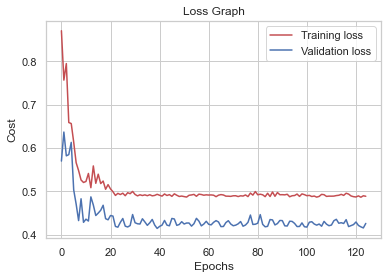

Fold 4


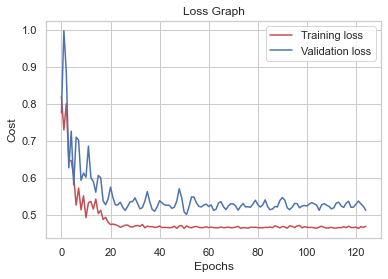

AUC Val: 0.8444299979397438
AUC Train: 0.8581587924261951
Specificity: 0.8928444735741392
Sensitivity: 0.5502794067457701
Positive Predictive Value: 0.733078681212535
Negative Predictive Value: 0.7822822451185913
5
Fold 0


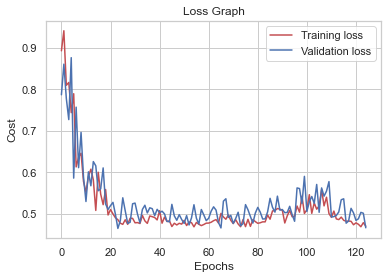

Fold 1


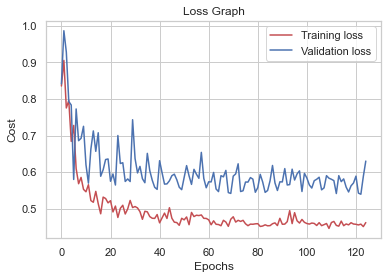

Fold 2


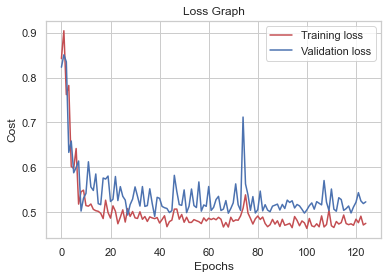

Fold 3


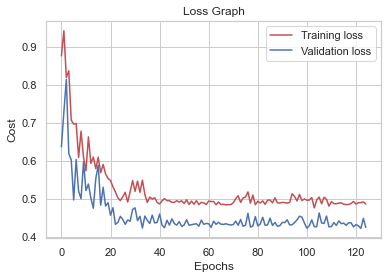

Fold 4


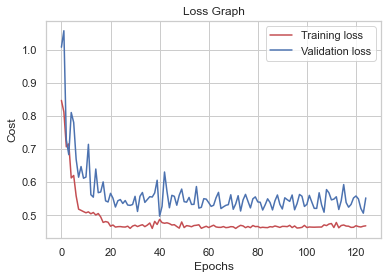

AUC Val: 0.8320075949615461
AUC Train: 0.8560428041874601
Specificity: 0.8775720608763533
Sensitivity: 0.5328170264837473
Positive Predictive Value: 0.701638502666083
Negative Predictive Value: 0.7726591241338968


In [63]:
aucReguPolys = []
for i in range(1,6):
    print(i)
    polyPred, aucPoly, spePoly, senPoly, ppvPoly, npvPoly, aucTrainPoly = cross_val('featPolEarly' + str(i) + '_' ,replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=['Age'], polyFeatDeg=i, regu='l2')
    aucReguPolys.append(aucPoly)

bestPolReguL2Deg = aucReguPolys.index(max(aucReguPolys)) + 1

In [64]:
print('Best Degree: ' + str(bestPolReguL2Deg) + " --- AUC: " + str(max(aucPolys)))

Best Degree: 3 --- AUC: 0.8497774882923362


#### Con DropOut

Fold 0


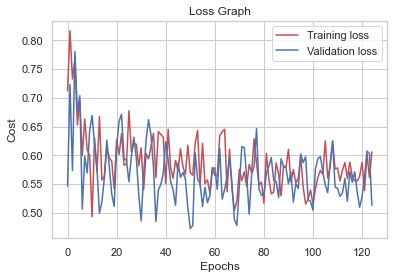

Fold 1


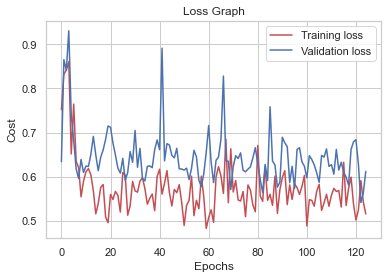

Fold 2


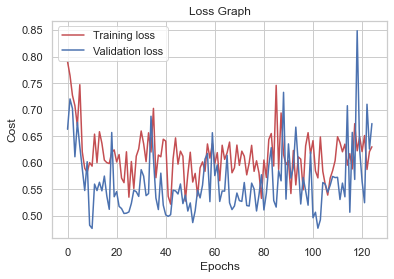

Fold 3


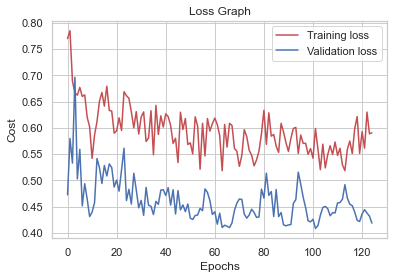

Fold 4


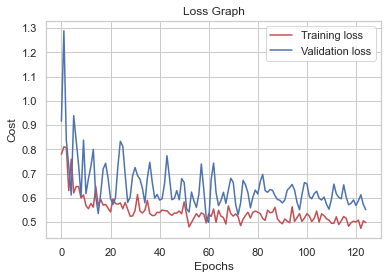

AUC Val: 0.8329162134610453
AUC Train: 0.8536444738525292
Specificity: 0.8591315681661967
Sensitivity: 0.597025137193539
Positive Predictive Value: 0.6939393920185338
Negative Predictive Value: 0.7953370992556943


(<__main__.DiabetesPredictor at 0x17de147c1c0>,
 0.8329162134610453,
 0.8591315681661967,
 0.597025137193539,
 0.6939393920185338,
 0.7953370992556943,
 0.8536444738525292)

In [65]:
cross_val('dropOut' ,replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=['Age'], polyFeatDeg=i, dropOut=True)

#### Con Batch Normalization

Fold 0


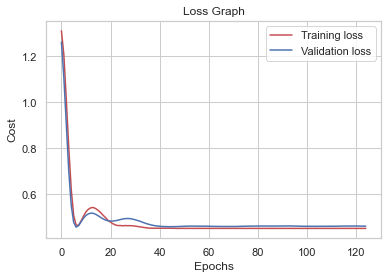

Fold 1


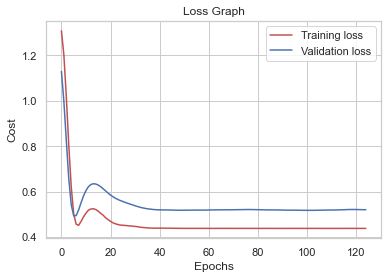

Fold 2


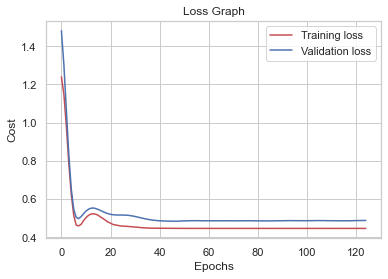

Fold 3


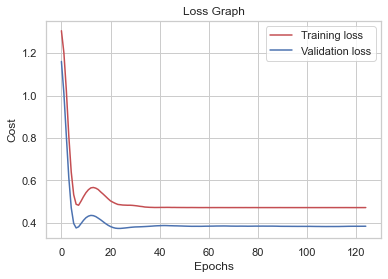

Fold 4


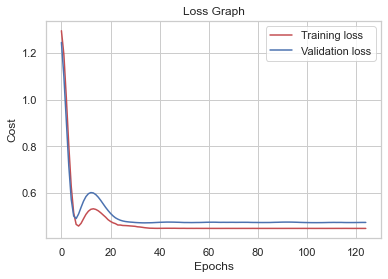

AUC Val: 0.8496076655822155
AUC Train: 0.8546564603553068
Specificity: 0.8755928262619678
Sensitivity: 0.5863707824468738
Positive Predictive Value: 0.7140693681200609
Negative Predictive Value: 0.793150603288189


(<__main__.DiabetesPredictor at 0x17de42a0460>,
 0.8496076655822155,
 0.8755928262619678,
 0.5863707824468738,
 0.7140693681200609,
 0.793150603288189,
 0.8546564603553068)

In [66]:
cross_val("batch",replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=['Age'])

Entre EarlyStopping, DropOut y regularizadores, los mejores resultados se obtuvieron con regularizadores.

Aunque no se obtuvieron mejoras utilizando featuresPolinomiales y regularización, estos se utilizarán en los próximos análisis a fin de evitar overfitting.

Fold 0


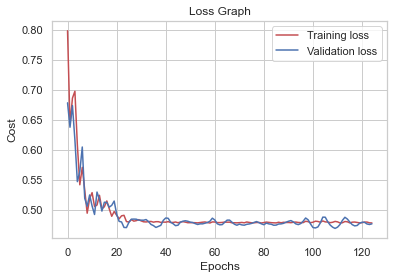

Fold 1


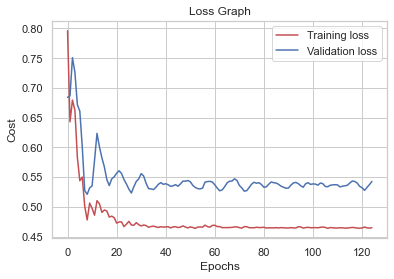

Fold 2


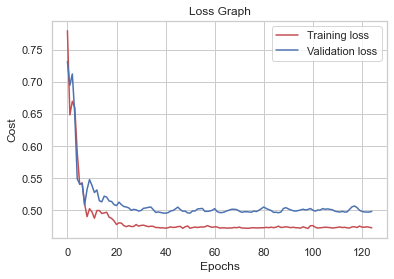

Fold 3


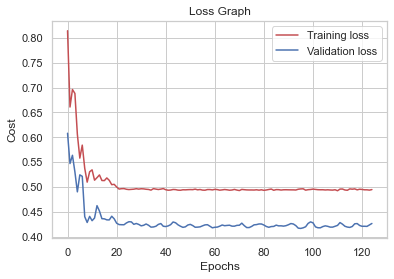

Fold 4


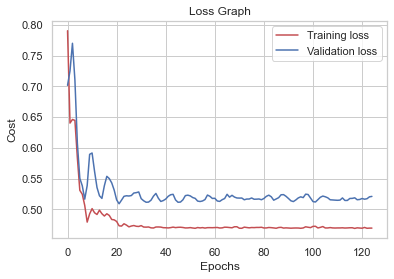

AUC Val: 0.8478628710858003
AUC Train: 0.8564979717860932
Specificity: 0.8980858303839134
Sensitivity: 0.5452794067582702
Positive Predictive Value: 0.7396081601412109
Negative Predictive Value: 0.7816946228408735


(<__main__.DiabetesPredictor at 0x17de142b880>,
 0.8478628710858003,
 0.8980858303839134,
 0.5452794067582702,
 0.7396081601412109,
 0.7816946228408735,
 0.8564979717860932)

In [67]:
cross_val('l2' ,replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=['Age'],polyFeatDeg=3, regu="l2")

### Variación del learning rate

1e-05
Fold 0


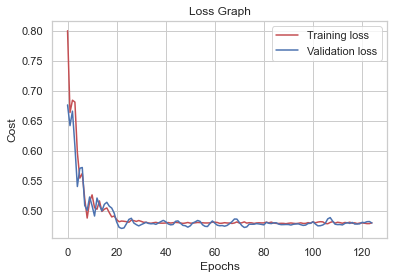

Fold 1


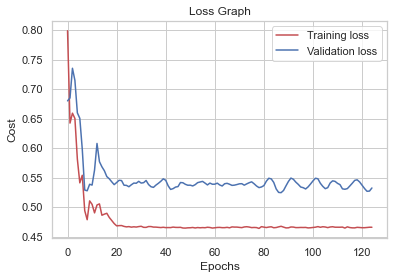

Fold 2


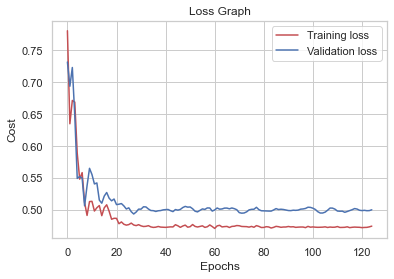

Fold 3


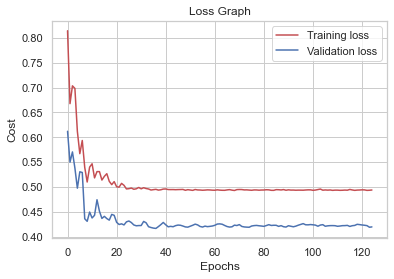

Fold 4


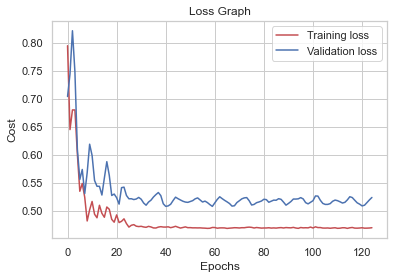

AUC Val: 0.8485895171907323
AUC Train: 0.8568265432594824
Specificity: 0.8980858303839134
Sensitivity: 0.5427493624956177
Positive Predictive Value: 0.7381157611870426
Negative Predictive Value: 0.7814430844202409
0.0001
Fold 0


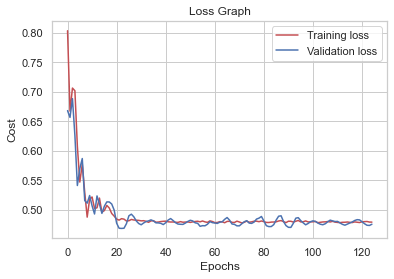

Fold 1


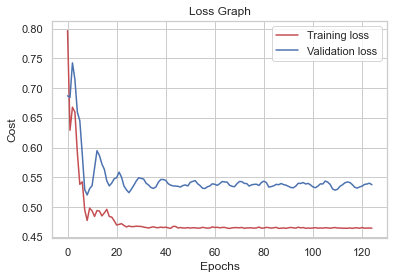

Fold 2


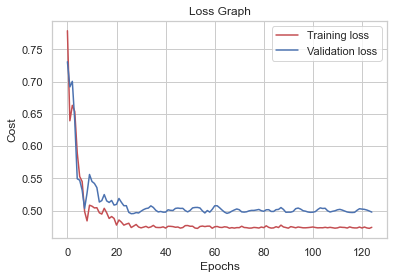

Fold 3


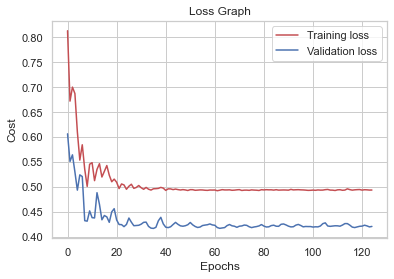

Fold 4


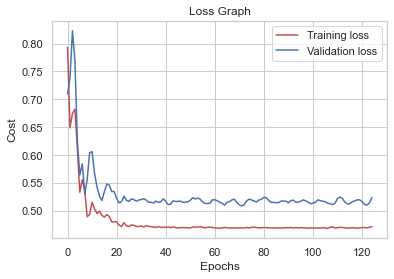

AUC Val: 0.8527184125133461
AUC Train: 0.8561191236701269
Specificity: 0.8862310084612938
Sensitivity: 0.5481301194356181
Positive Predictive Value: 0.7171183451353194
Negative Predictive Value: 0.7813562640374329
0.001
Fold 0


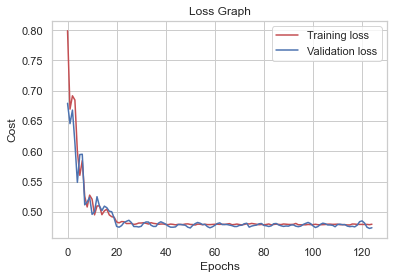

Fold 1


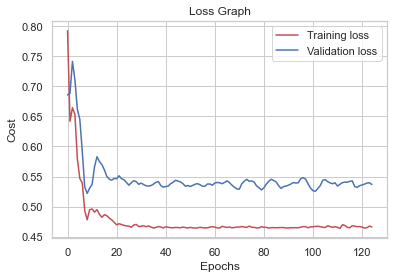

Fold 2


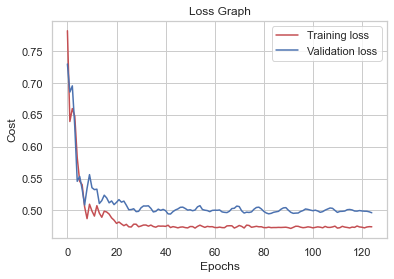

Fold 3


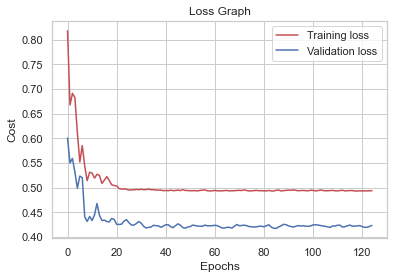

Fold 4


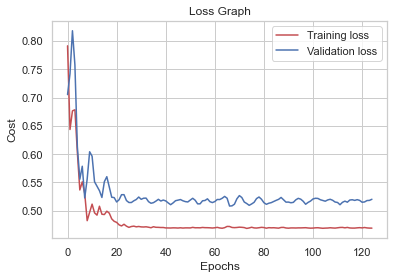

AUC Val: 0.8517935818364968
AUC Train: 0.8566955418752805
Specificity: 0.8953080526099937
Sensitivity: 0.5545817323180322
Positive Predictive Value: 0.7378410823913829
Negative Predictive Value: 0.7845785000686426
0.01
Fold 0


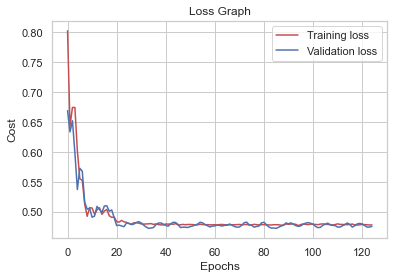

Fold 1


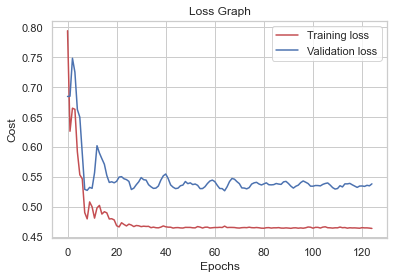

Fold 2


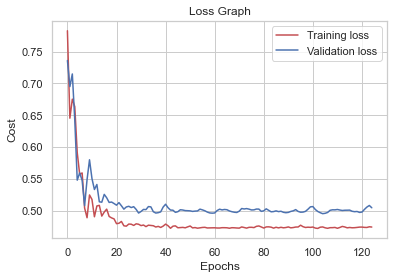

Fold 3


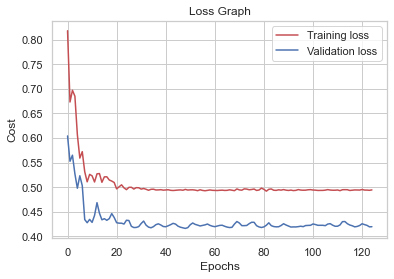

Fold 4


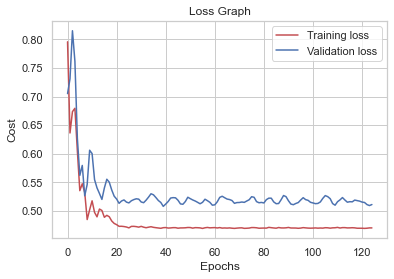

AUC Val: 0.8504811967148302
AUC Train: 0.8563371738056572
Specificity: 0.8956341395657533
Sensitivity: 0.5567028508352607
Positive Predictive Value: 0.738003738380894
Negative Predictive Value: 0.7863112950777832
0.1
Fold 0


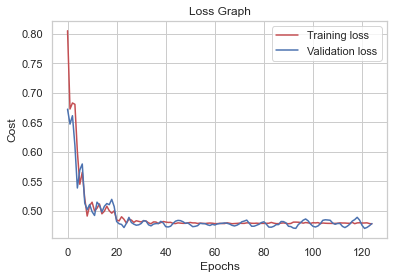

Fold 1


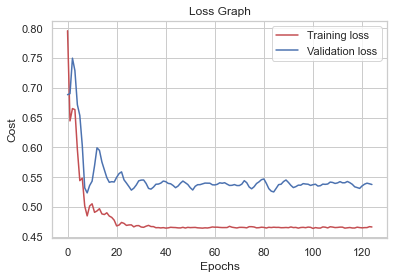

Fold 2


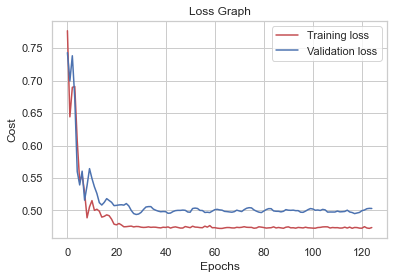

Fold 3


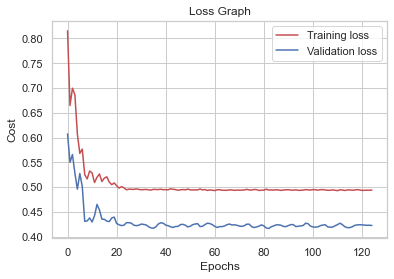

Fold 4


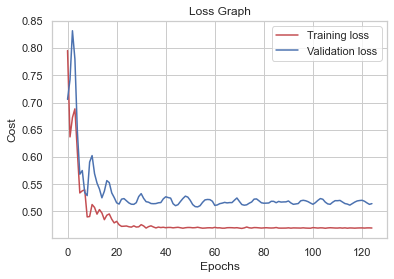

AUC Val: 0.8509946274114568
AUC Train: 0.8567441553473687
Specificity: 0.8951063783335002
Sensitivity: 0.5388277938758561
Positive Predictive Value: 0.7340227857228239
Negative Predictive Value: 0.7789771455193522
1
Fold 0


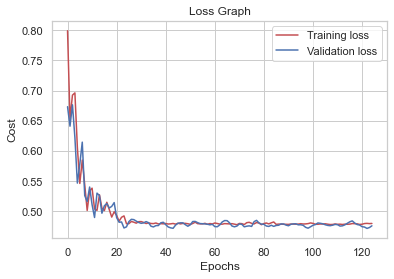

Fold 1


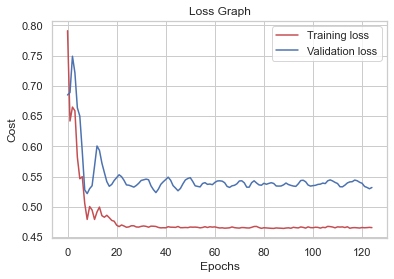

Fold 2


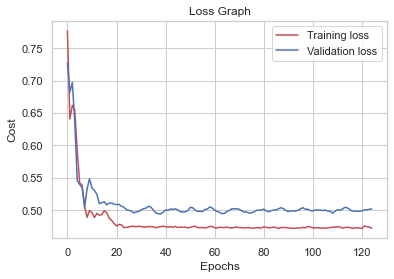

Fold 3


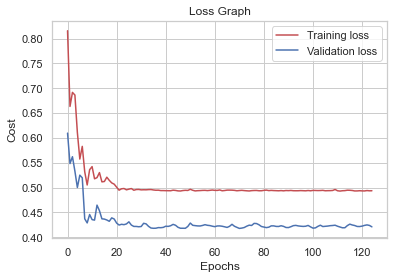

Fold 4


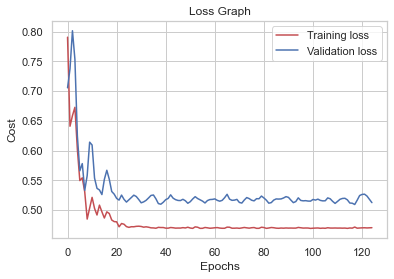

AUC Val: 0.8525657409997681
AUC Train: 0.8566533476345137
Specificity: 0.8887690602084444
Sensitivity: 0.5431301194481181
Positive Predictive Value: 0.7203776972223138
Negative Predictive Value: 0.7800358239293175


In [68]:
aucLrPolys = []
lrs = [1e-5, 1e-4, 1e-3, 1e-2, 0.1, 1]
for lr in lrs:
    print(lr)
    lrPred, aucLr, speLr, senLr, ppvLr, npvLr, aucTrainLr = cross_val('lr'+str(lr) ,replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=['Age'],polyFeatDeg=3, regu="l2", learning_rate=lr)
    aucLrPolys.append(aucLr)

bestLr = lrs[aucLrPolys.index(max(aucLrPolys))]

In [69]:
print('Best LR: ' + str(bestLr) + " --- AUC: " + str(max(aucLrPolys)))

Best LR: 0.0001 --- AUC: 0.8527184125133461


### Variando momentum

0.9
Fold 0


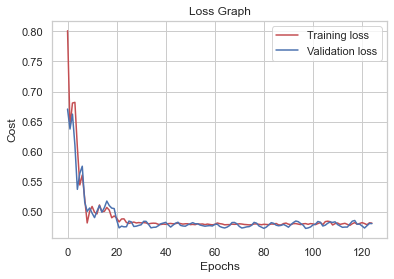

Fold 1


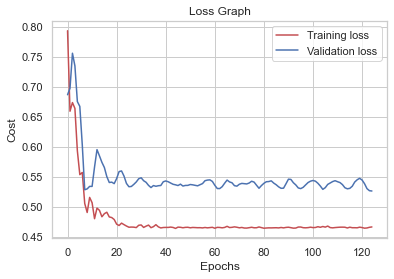

Fold 2


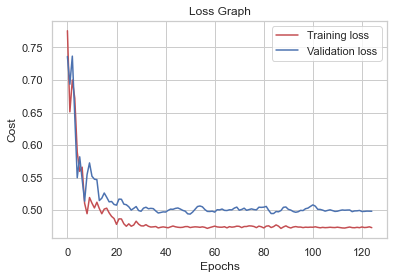

Fold 3


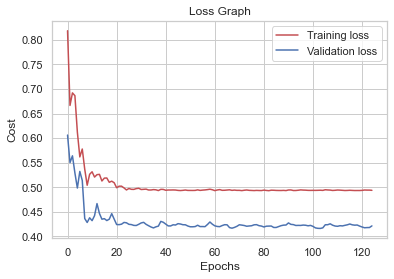

Fold 4


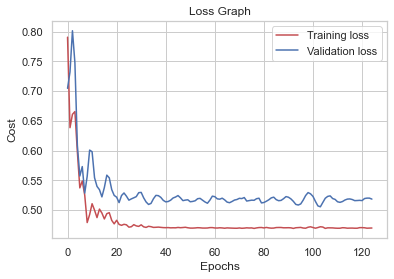

AUC Val: 0.8517017271090641
AUC Train: 0.8570221681923756
Specificity: 0.900547778630513
Sensitivity: 0.5488521381704128
Positive Predictive Value: 0.7438391241835781
Negative Predictive Value: 0.7839158189915876
0.99
Fold 0


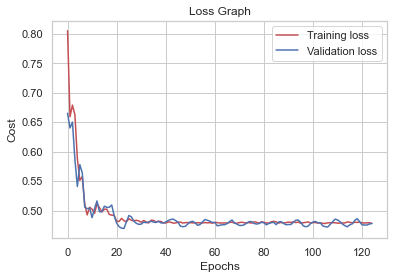

Fold 1


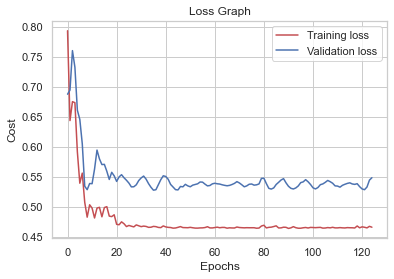

Fold 2


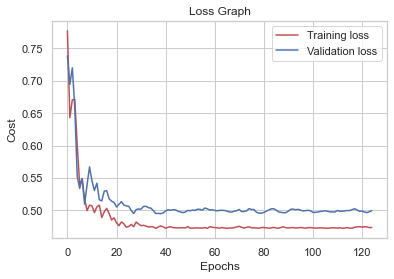

Fold 3


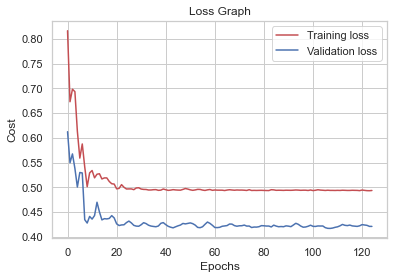

Fold 4


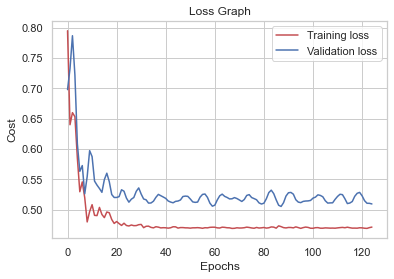

AUC Val: 0.8482451676546197
AUC Train: 0.8571204010978117
Specificity: 0.9011135916130419
Sensitivity: 0.5481301194356181
Positive Predictive Value: 0.7435423173800528
Negative Predictive Value: 0.7842698251854706
0.999
Fold 0


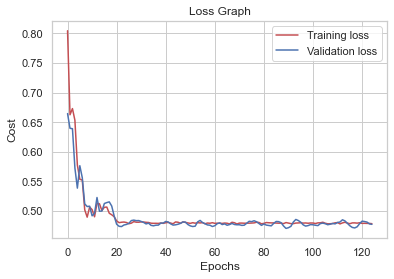

Fold 1


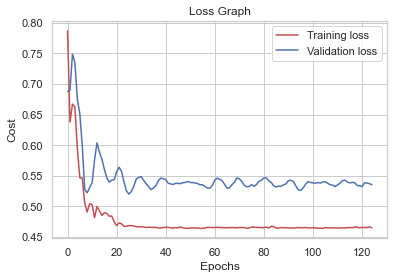

Fold 2


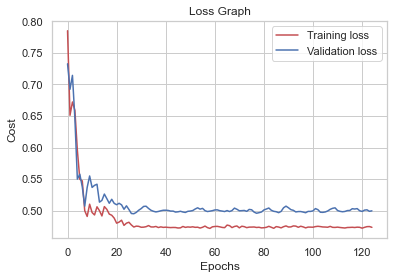

Fold 3


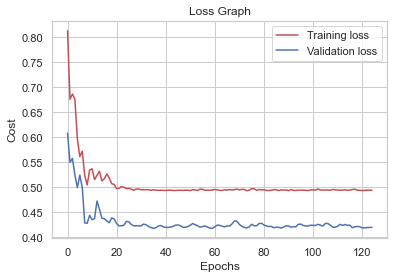

Fold 4


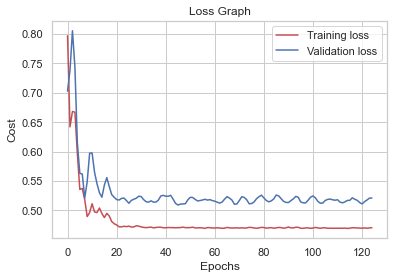

AUC Val: 0.8497808547685256
AUC Train: 0.8573411050516381
Specificity: 0.9008255564075578
Sensitivity: 0.5388277938758561
Positive Predictive Value: 0.7415109902070058
Negative Predictive Value: 0.7804678104451672
0.9999
Fold 0


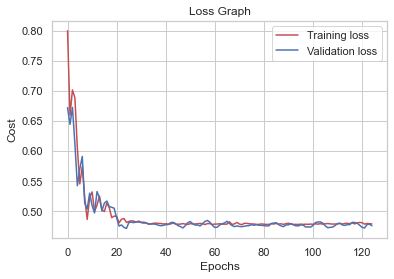

Fold 1


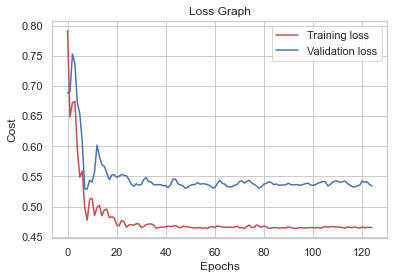

Fold 2


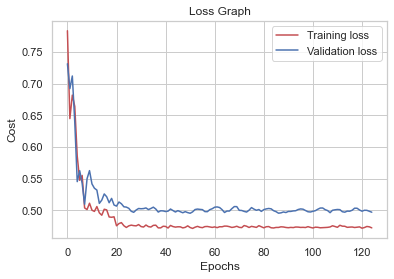

Fold 3


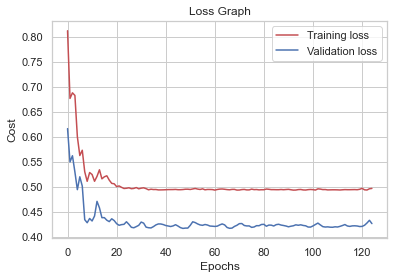

Fold 4


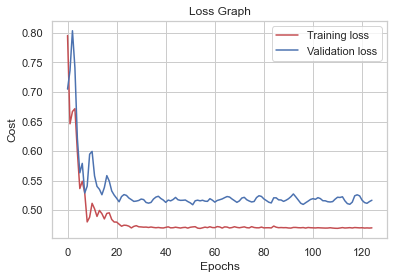

AUC Val: 0.8525431424253729
AUC Train: 0.8570864523463113
Specificity: 0.8928080526131186
Sensitivity: 0.5481301194356181
Positive Predictive Value: 0.7315086183872817
Negative Predictive Value: 0.7822173101877411


In [70]:
aucsMom = []
moms = [0.9, 0.99, 0.999, 0.9999]
for mom in moms:
    print(mom)
    momPred, aucMom, speMom, senMom, ppvMom, npvMom, aucTrainMom = cross_val('lr'+str(lr) ,replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=['Age'], polyFeatDeg=3, regu="l2", learning_rate=1, momentum=mom)
    aucsMom.append(aucMom)

bestMom = moms[aucsMom.index(max(aucsMom))]

In [71]:
print('Best Mom: ' + str(bestMom) + " --- AUC: " + str(max(aucsMom)))

Best Mom: 0.9999 --- AUC: 0.8525431424253729


### Variando learning rate decay

0.001
Fold 0


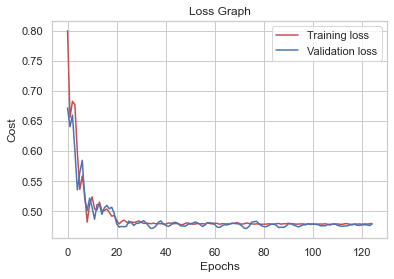

Fold 1


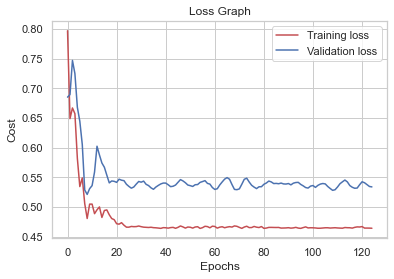

Fold 2


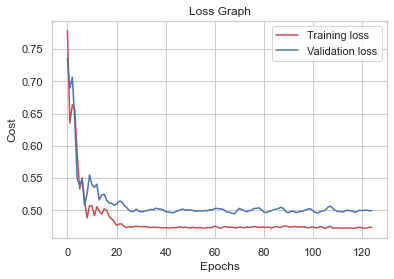

Fold 3


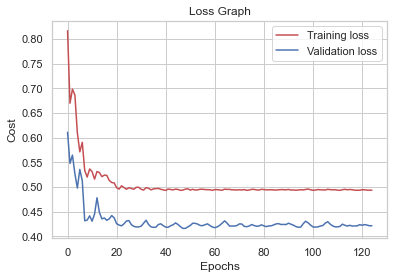

Fold 4


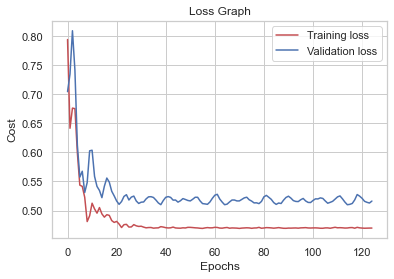

AUC Val: 0.8510727681875284
AUC Train: 0.8567285311879
Specificity: 0.8956341395657533
Sensitivity: 0.5474005252754987
Positive Predictive Value: 0.7346949148347894
Negative Predictive Value: 0.7828046893317799
0.0001
Fold 0


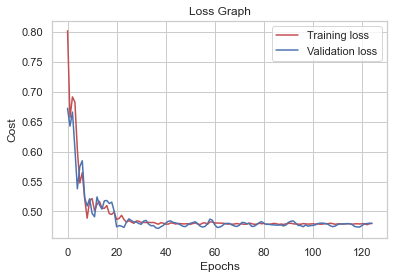

Fold 1


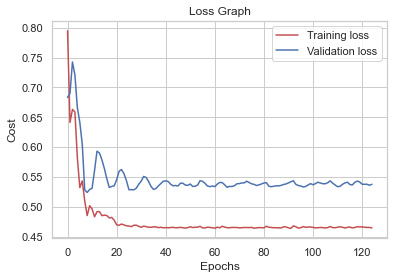

Fold 2


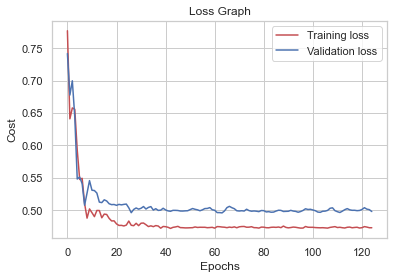

Fold 3


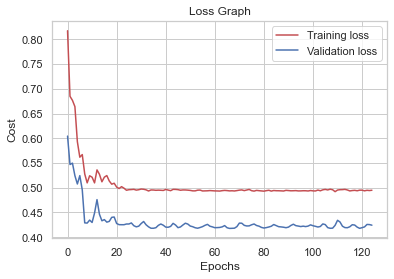

Fold 4


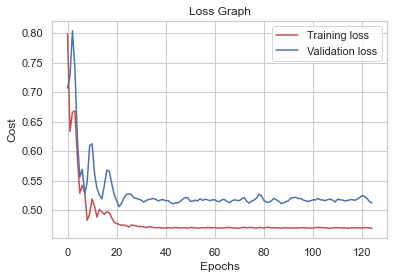

AUC Val: 0.849623378568405
AUC Train: 0.8568229267006846
Specificity: 0.9005858303807885
Sensitivity: 0.5449305695506512
Positive Predictive Value: 0.7441340221781175
Negative Predictive Value: 0.782203828548569
1e-05
Fold 0


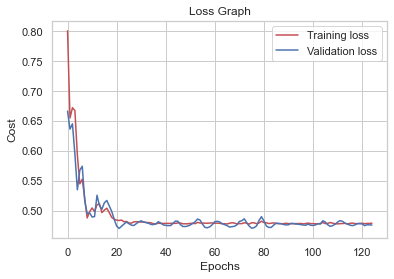

Fold 1


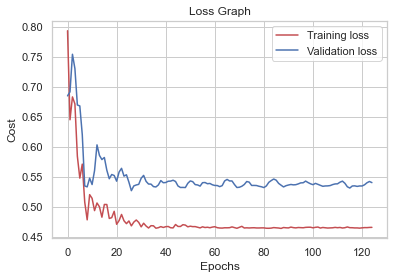

Fold 2


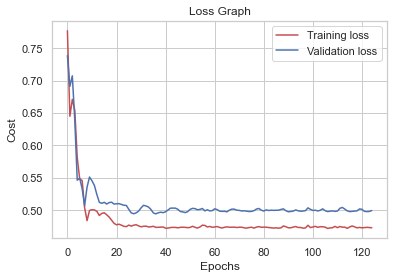

Fold 3


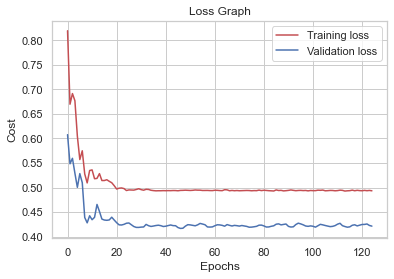

Fold 4


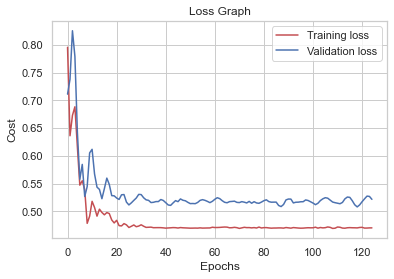

AUC Val: 0.851583898305924
AUC Train: 0.8566170450607477
Specificity: 0.8980477786336379
Sensitivity: 0.5481301194356181
Positive Predictive Value: 0.7397439124571779
Negative Predictive Value: 0.7833516876729364


In [72]:
aucsDecays = []
decays = [1e-3, 1e-4, 1e-5]
for dec in decays:
    print(dec)
    decPred, aucDec, speDec, senDec, ppvDec, npvDec, aucTrainDec = cross_val("dec"+str(dec),replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=['Age'], polyFeatDeg=3, regu="l2", learning_rate=1, momentum=0.9, decay=dec)
    aucsDecays.append(aucDec)

bestDec = decays[aucsDecays.index(max(aucsDecays))]

In [73]:
print('Best Decay: ' + str(bestDec) + " --- AUC: " + str(max(aucsDecays)))

Best Decay: 1e-05 --- AUC: 0.851583898305924


### Multilayer

Fold 0


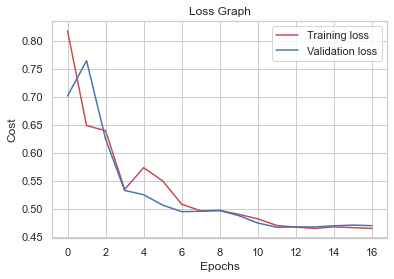

Fold 1


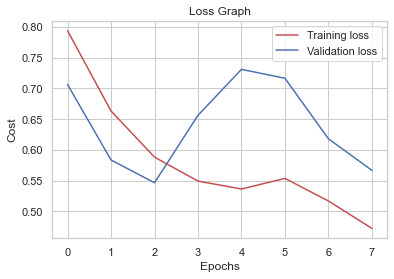

Fold 2


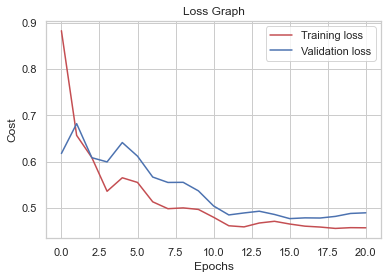

Fold 3


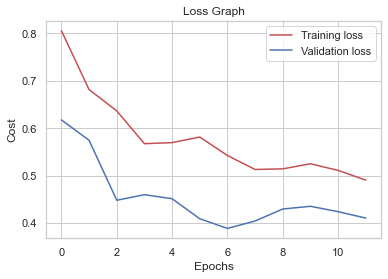

Fold 4


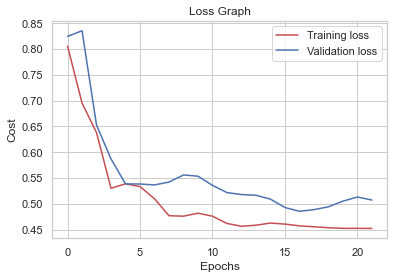

AUC Val: 0.8479201165242491
AUC Train: 0.8551338742144405
Specificity: 0.8896502300257151
Sensitivity: 0.5578413707408041
Positive Predictive Value: 0.7268033985761657
Negative Predictive Value: 0.785418177013441


(<__main__.DiabetesPredictor at 0x17de7449e20>,
 0.8479201165242491,
 0.8896502300257151,
 0.5578413707408041,
 0.7268033985761657,
 0.785418177013441,
 0.8551338742144405)

In [75]:
cross_val('multi',replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=['Age'], polyFeatDeg=3, learning_rate=1, momentum=0.9, decay=1e-5, multilayer=True, earlyStop = True)